In [1]:
import os
print(os.listdir("../ai assignment/Generative Dog Images/all-dogs"))


['all-dogs']


In [2]:

from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm


C:\Users\GF63\anaconda3\envs\Pandas\Lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
C:\Users\GF63\anaconda3\envs\Pandas\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


There are 20579 pictures of dogs.


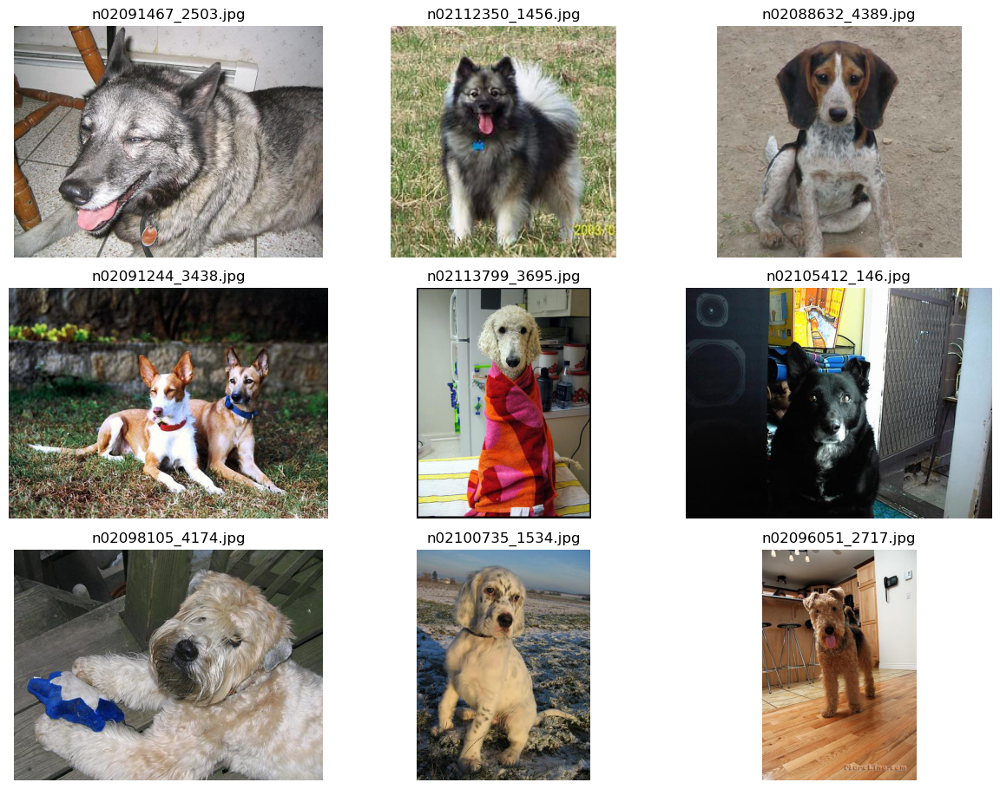

In [10]:
PATH = '../ai assignment/Generative Dog Images/all-dogs/all-dogs/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures of dogs.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [3]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('../ai assignment/Generative Dog Images/all-dogs/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


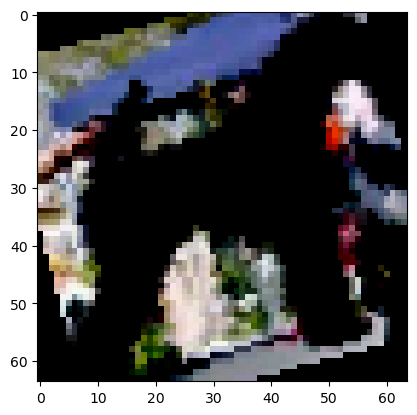

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


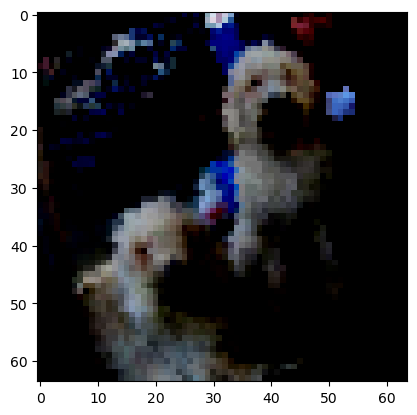

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


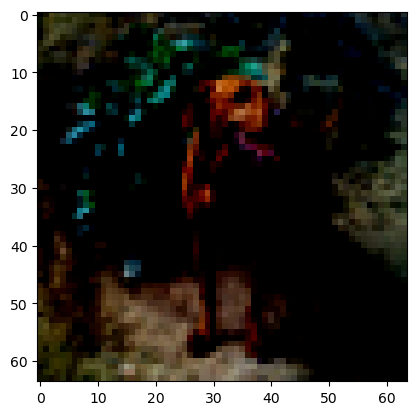

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


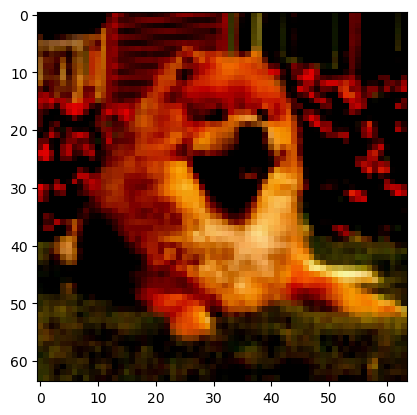

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


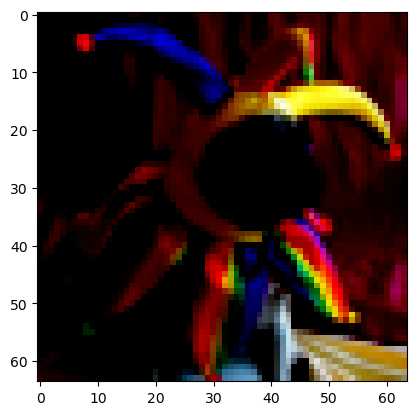

In [4]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

In [5]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [6]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [7]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [8]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

In [9]:
!mkdir results
!dir

A subdirectory or file results already exists.


 Volume in drive C is Windows
 Volume Serial Number is 867B-BFD8

 Directory of C:\Users\GF63\OneDrive\Documents\ai assignment

04/11/2024  07:40 PM    <DIR>          .
04/09/2024  03:04 PM    <DIR>          ..
04/09/2024  03:42 PM    <DIR>          .ipynb_checkpoints
04/11/2024  07:40 PM         1,948,930 Gen AI.ipynb
04/09/2024  03:20 PM    <DIR>          Generative Dog Images
04/09/2024  03:06 PM    <DIR>          Output
04/09/2024  05:56 PM    <DIR>          results
               1 File(s)      1,948,930 bytes
               6 Dir(s)  221,490,860,032 bytes free


In [10]:
EPOCH = 0 # play with me
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [11]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        # 1st Step: Updating the weights of the neural network of the discriminator
        netD.zero_grad()
        
        # Training the discriminator with a real image of the dataset
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        # Training the discriminator with a fake image generated by the generator
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        # Backpropagating the total error
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        # 2nd Step: Updating the weights of the neural network of the generator
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

In [12]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [13]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [14]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [15]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

 50%|█████     | 322/644 [09:25<09:45,  1.82s/it]

[1/100][322/644] Loss_D: 1.3406 Loss_G: 1.1985 D(x): 0.4633 D(G(z)): 0.4007 / 0.2910


100%|██████████| 644/644 [18:52<00:00,  1.76s/it]

[1/100][644/644] Loss_D: 1.8573 Loss_G: 0.9544 D(x): 0.2003 D(G(z)): 0.2575 / 0.3737


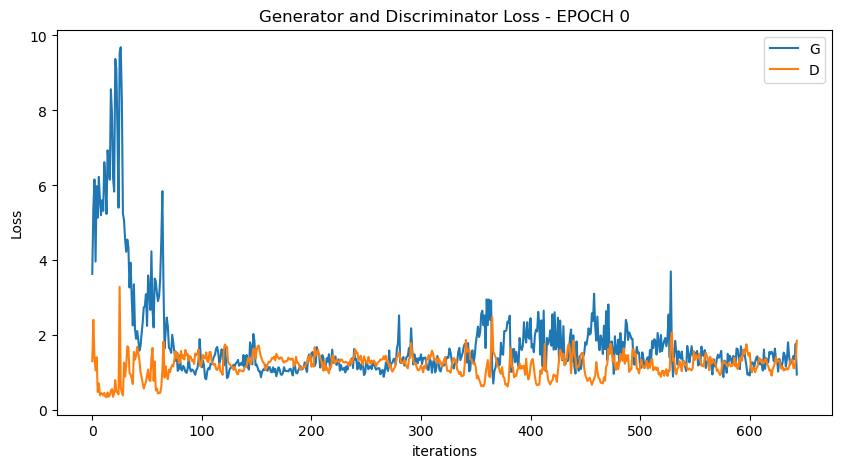

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


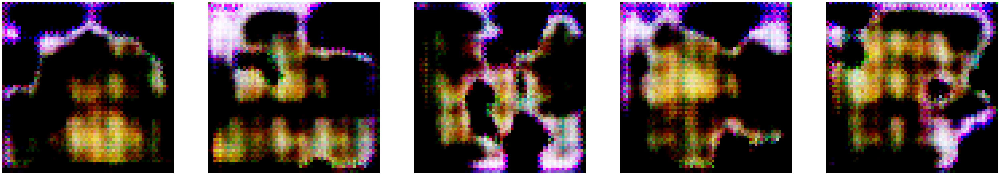

 50%|█████     | 322/644 [09:24<09:37,  1.79s/it]

[2/100][322/644] Loss_D: 0.9829 Loss_G: 2.4785 D(x): 0.7060 D(G(z)): 0.3879 / 0.0715


100%|██████████| 644/644 [18:53<00:00,  1.76s/it]

[2/100][644/644] Loss_D: 0.9979 Loss_G: 2.4741 D(x): 0.5696 D(G(z)): 0.3094 / 0.0666


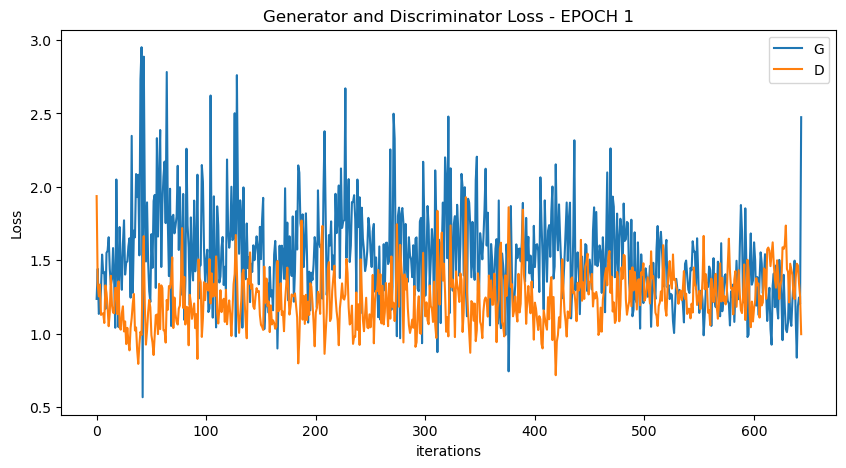

 50%|█████     | 322/644 [09:34<09:42,  1.81s/it]

[3/100][322/644] Loss_D: 1.4117 Loss_G: 1.0696 D(x): 0.4276 D(G(z)): 0.3913 / 0.3428


100%|██████████| 644/644 [18:56<00:00,  1.77s/it]

[3/100][644/644] Loss_D: 1.5642 Loss_G: 1.7252 D(x): 0.3665 D(G(z)): 0.4274 / 0.1523


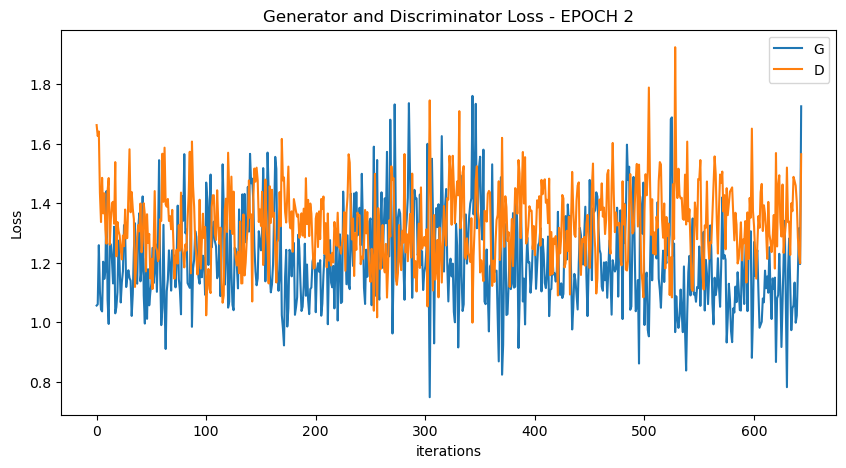

 50%|█████     | 322/644 [09:22<09:14,  1.72s/it]

[4/100][322/644] Loss_D: 1.2943 Loss_G: 1.0349 D(x): 0.4749 D(G(z)): 0.3956 / 0.3481


100%|██████████| 644/644 [18:41<00:00,  1.74s/it]

[4/100][644/644] Loss_D: 1.2757 Loss_G: 1.5419 D(x): 0.3664 D(G(z)): 0.2617 / 0.1953


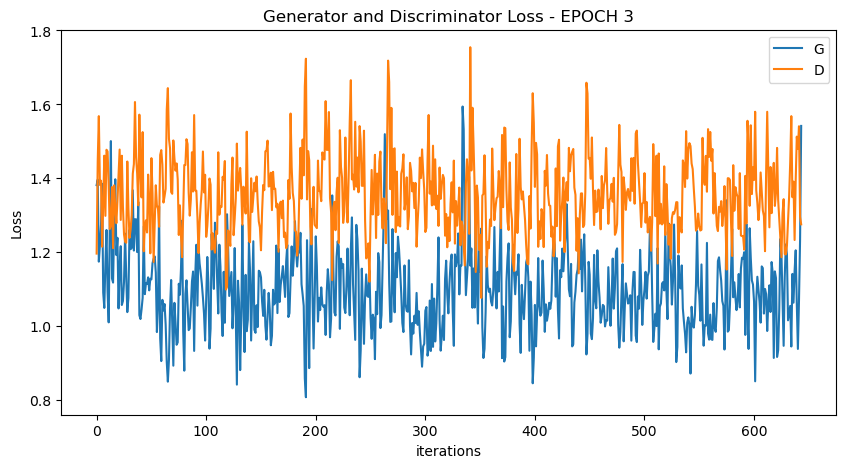

 50%|█████     | 322/644 [09:21<09:03,  1.69s/it]

[5/100][322/644] Loss_D: 1.2927 Loss_G: 1.0871 D(x): 0.3979 D(G(z)): 0.3120 / 0.3234


100%|██████████| 644/644 [18:41<00:00,  1.74s/it]

[5/100][644/644] Loss_D: 1.4148 Loss_G: 2.7954 D(x): 0.5692 D(G(z)): 0.5049 / 0.0532


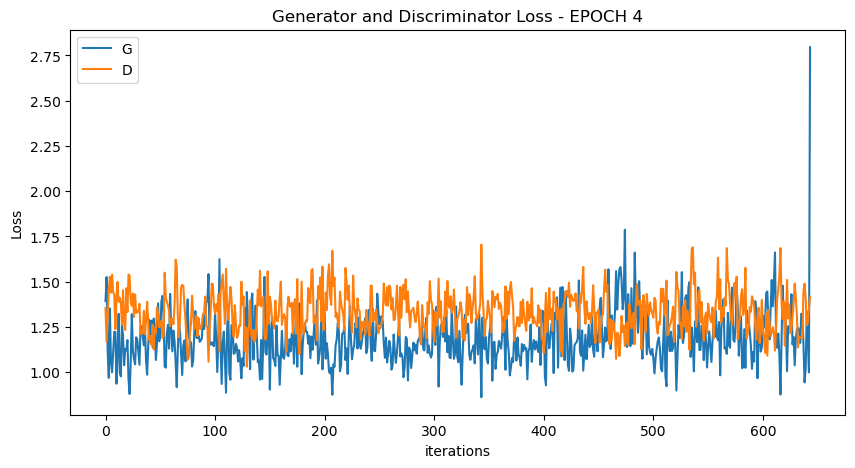

 50%|█████     | 322/644 [09:18<09:06,  1.70s/it]

[6/100][322/644] Loss_D: 1.4357 Loss_G: 1.1872 D(x): 0.5803 D(G(z)): 0.5031 / 0.3023


100%|██████████| 644/644 [18:39<00:00,  1.74s/it]

[6/100][644/644] Loss_D: 1.2012 Loss_G: 1.9550 D(x): 0.5016 D(G(z)): 0.3866 / 0.1245


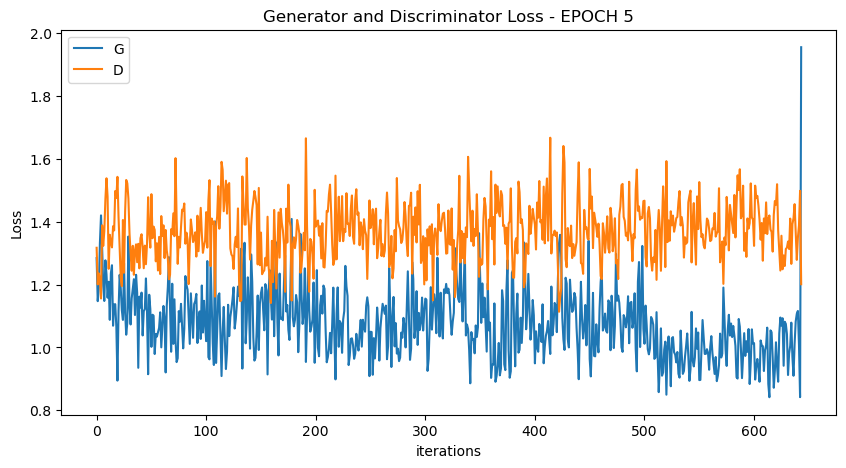

 50%|█████     | 322/644 [09:19<08:59,  1.67s/it]

[7/100][322/644] Loss_D: 1.5398 Loss_G: 0.8999 D(x): 0.4457 D(G(z)): 0.4947 / 0.4001


100%|██████████| 644/644 [18:37<00:00,  1.74s/it]

[7/100][644/644] Loss_D: 1.2706 Loss_G: 1.4308 D(x): 0.3548 D(G(z)): 0.2472 / 0.2100


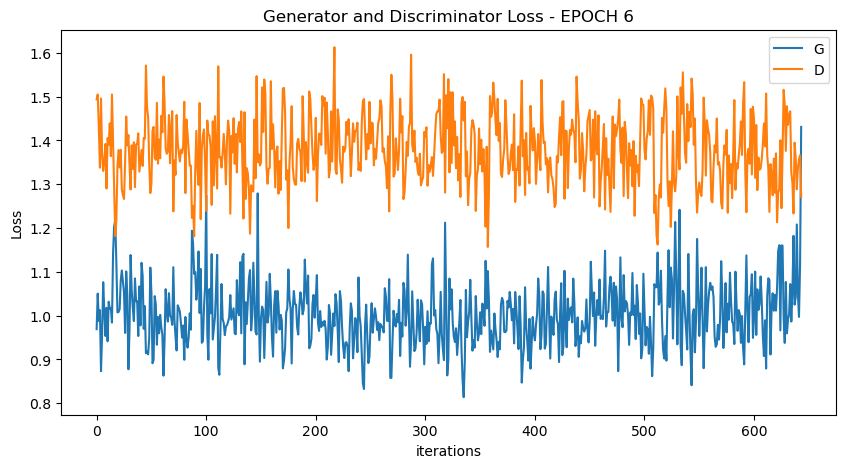

 50%|█████     | 322/644 [09:18<09:08,  1.70s/it]

[8/100][322/644] Loss_D: 1.4096 Loss_G: 0.9603 D(x): 0.4992 D(G(z)): 0.4863 / 0.3832


100%|██████████| 644/644 [18:34<00:00,  1.73s/it]

[8/100][644/644] Loss_D: 1.0007 Loss_G: 1.8092 D(x): 0.5158 D(G(z)): 0.2728 / 0.1444


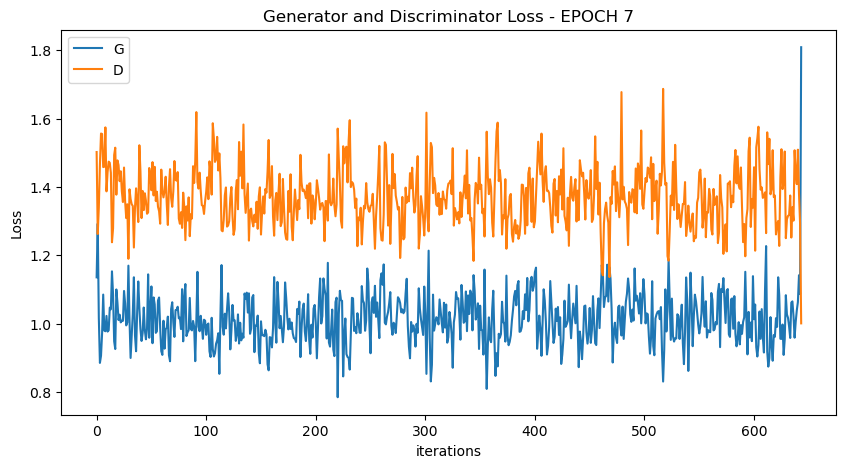

 50%|█████     | 322/644 [09:15<09:34,  1.78s/it]

[9/100][322/644] Loss_D: 1.2478 Loss_G: 1.1039 D(x): 0.5042 D(G(z)): 0.4176 / 0.3136


100%|██████████| 644/644 [18:33<00:00,  1.73s/it]

[9/100][644/644] Loss_D: 1.5520 Loss_G: 1.5062 D(x): 0.3596 D(G(z)): 0.3945 / 0.2030


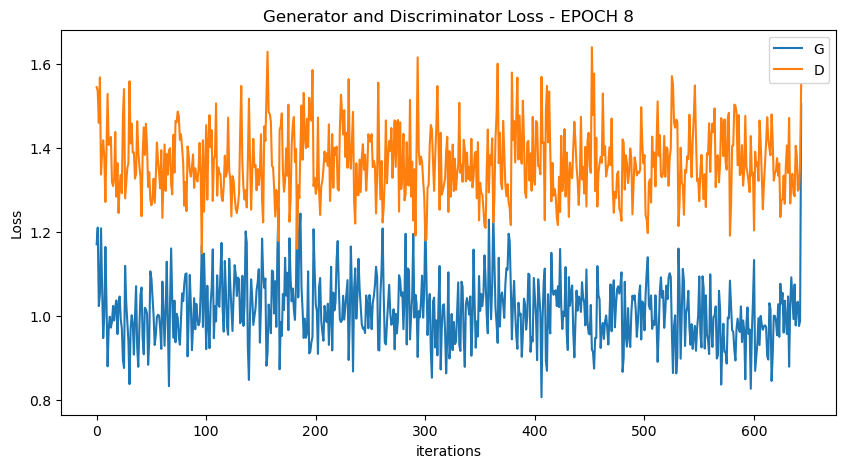

 50%|█████     | 322/644 [09:17<08:46,  1.64s/it]

[10/100][322/644] Loss_D: 1.2624 Loss_G: 1.0446 D(x): 0.5050 D(G(z)): 0.4202 / 0.3349


100%|██████████| 644/644 [18:33<00:00,  1.73s/it]

[10/100][644/644] Loss_D: 1.3962 Loss_G: 1.3220 D(x): 0.3366 D(G(z)): 0.2956 / 0.2439


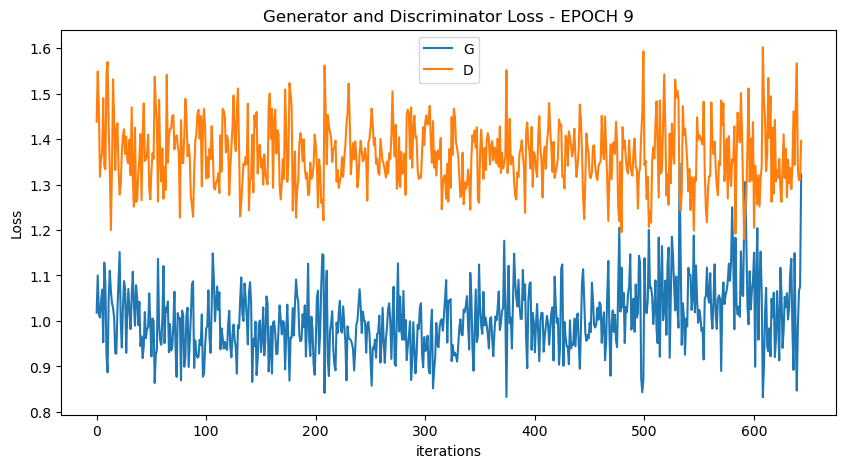

 50%|█████     | 322/644 [09:19<09:00,  1.68s/it]

[11/100][322/644] Loss_D: 1.4458 Loss_G: 0.8959 D(x): 0.4155 D(G(z)): 0.4346 / 0.3968


100%|██████████| 644/644 [18:33<00:00,  1.73s/it]

[11/100][644/644] Loss_D: 1.4959 Loss_G: 1.3779 D(x): 0.3835 D(G(z)): 0.4273 / 0.2249


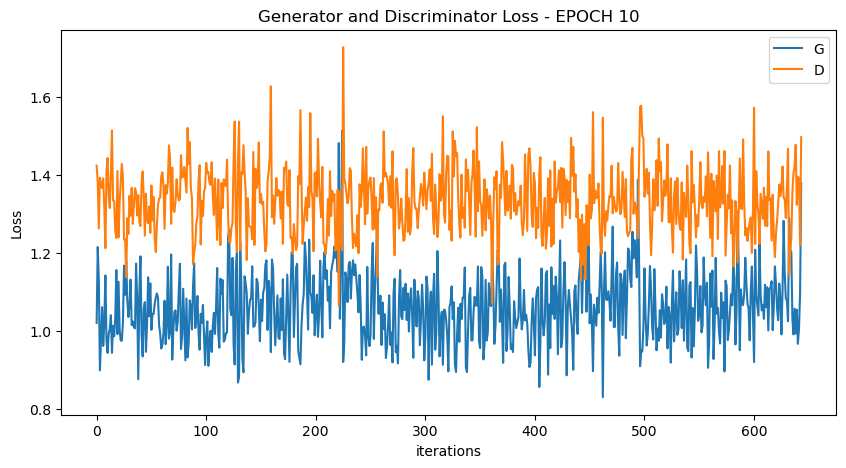

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


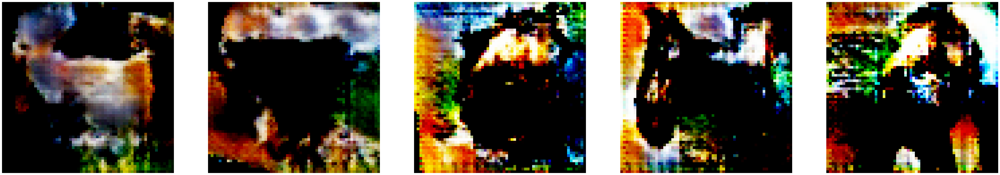

 50%|█████     | 322/644 [09:15<09:21,  1.74s/it]

[12/100][322/644] Loss_D: 1.3027 Loss_G: 1.0405 D(x): 0.4758 D(G(z)): 0.4042 / 0.3439


100%|██████████| 644/644 [18:30<00:00,  1.72s/it]

[12/100][644/644] Loss_D: 1.1056 Loss_G: 1.6891 D(x): 0.3904 D(G(z)): 0.1876 / 0.1607


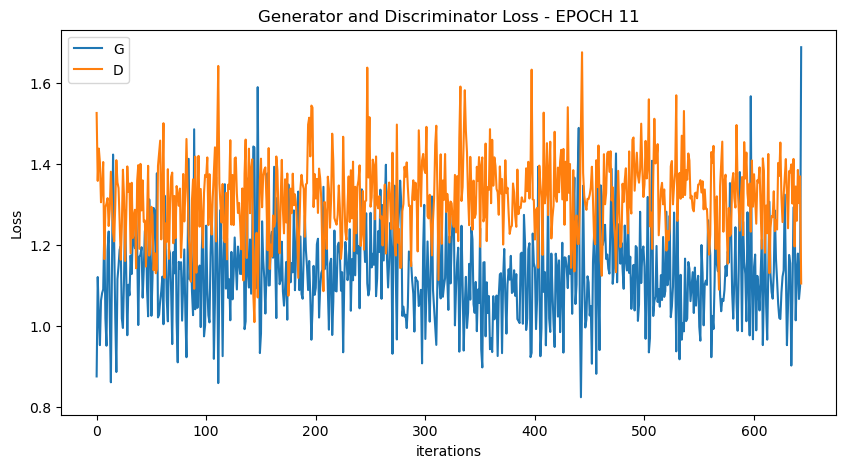

 50%|█████     | 322/644 [09:15<09:05,  1.69s/it]

[13/100][322/644] Loss_D: 1.3835 Loss_G: 0.9392 D(x): 0.4687 D(G(z)): 0.4491 / 0.3850


100%|██████████| 644/644 [18:31<00:00,  1.73s/it]

[13/100][644/644] Loss_D: 1.1473 Loss_G: 2.2620 D(x): 0.6042 D(G(z)): 0.4356 / 0.0829


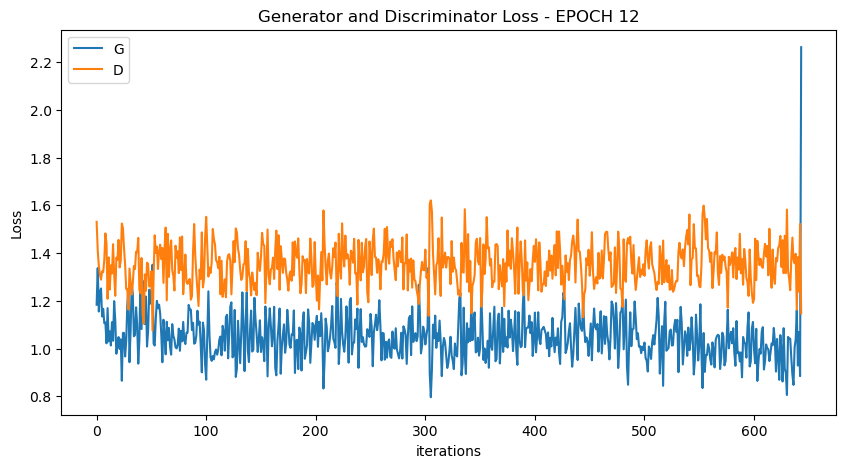

 50%|█████     | 322/644 [09:13<08:45,  1.63s/it]

[14/100][322/644] Loss_D: 1.2602 Loss_G: 1.1005 D(x): 0.5026 D(G(z)): 0.4168 / 0.3161


100%|██████████| 644/644 [18:27<00:00,  1.72s/it]

[14/100][644/644] Loss_D: 1.5159 Loss_G: 1.4618 D(x): 0.4095 D(G(z)): 0.4540 / 0.2108


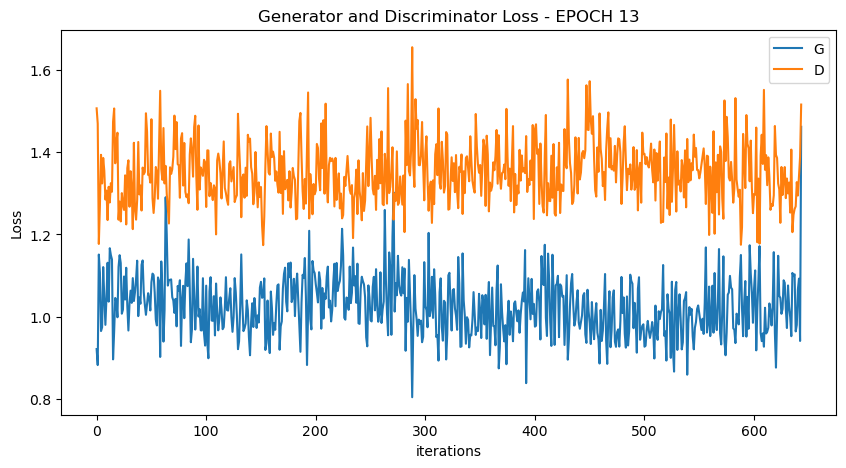

 50%|█████     | 322/644 [09:14<09:31,  1.78s/it]

[15/100][322/644] Loss_D: 1.2097 Loss_G: 1.0058 D(x): 0.5341 D(G(z)): 0.4143 / 0.3519


100%|██████████| 644/644 [18:29<00:00,  1.72s/it]

[15/100][644/644] Loss_D: 1.3000 Loss_G: 1.7214 D(x): 0.4187 D(G(z)): 0.3559 / 0.1579


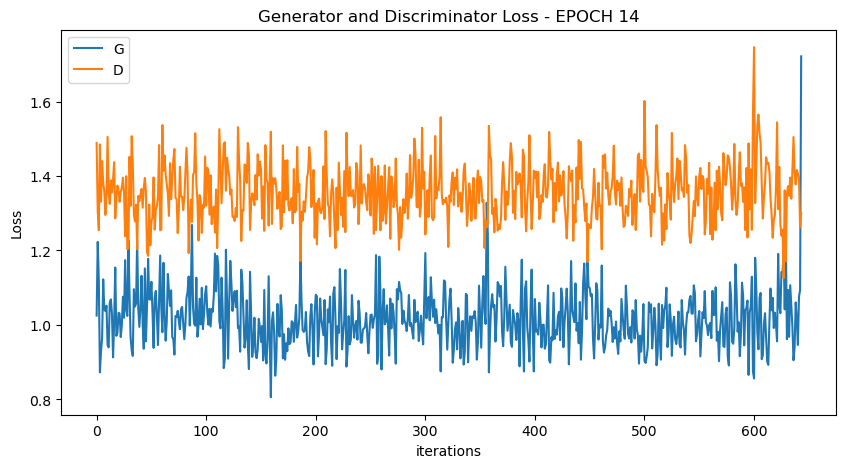

 50%|█████     | 322/644 [09:17<08:43,  1.62s/it]

[16/100][322/644] Loss_D: 1.2346 Loss_G: 1.1289 D(x): 0.5048 D(G(z)): 0.3984 / 0.3117


100%|██████████| 644/644 [18:33<00:00,  1.73s/it]

[16/100][644/644] Loss_D: 1.1560 Loss_G: 2.0175 D(x): 0.5009 D(G(z)): 0.3575 / 0.1136


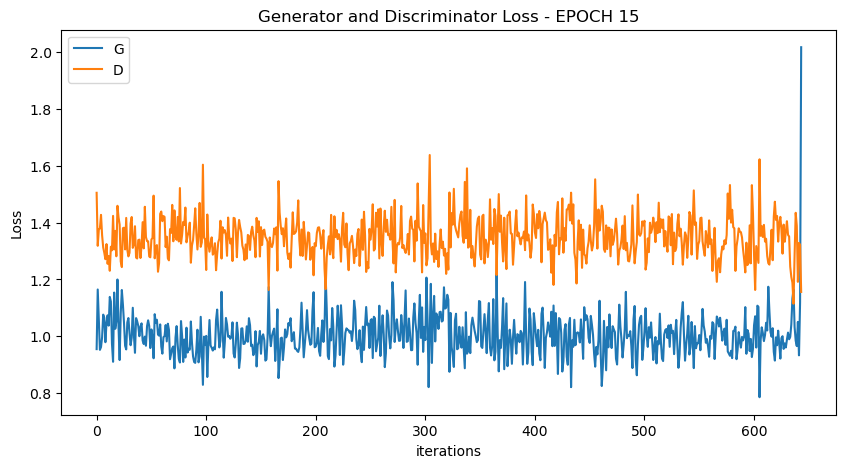

 50%|█████     | 322/644 [09:14<09:33,  1.78s/it]

[17/100][322/644] Loss_D: 1.5299 Loss_G: 1.0183 D(x): 0.4885 D(G(z)): 0.5372 / 0.3478


100%|██████████| 644/644 [18:28<00:00,  1.72s/it]

[17/100][644/644] Loss_D: 0.8429 Loss_G: 2.1343 D(x): 0.6690 D(G(z)): 0.2950 / 0.1020


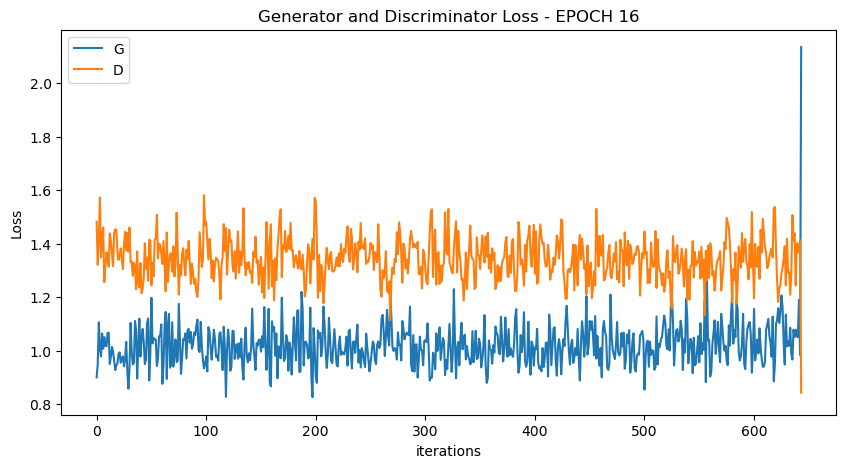

 50%|█████     | 322/644 [09:16<08:59,  1.67s/it]

[18/100][322/644] Loss_D: 1.3620 Loss_G: 1.3006 D(x): 0.5789 D(G(z)): 0.5247 / 0.2589


100%|██████████| 644/644 [18:34<00:00,  1.73s/it]

[18/100][644/644] Loss_D: 1.0837 Loss_G: 1.6459 D(x): 0.4345 D(G(z)): 0.2387 / 0.1641


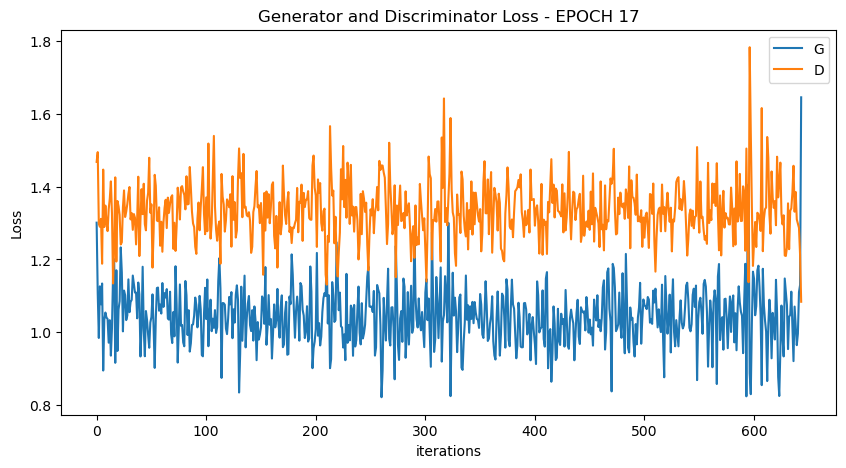

 50%|█████     | 322/644 [09:18<09:23,  1.75s/it]

[19/100][322/644] Loss_D: 1.3208 Loss_G: 1.1992 D(x): 0.5139 D(G(z)): 0.4493 / 0.2883


100%|██████████| 644/644 [18:35<00:00,  1.73s/it]

[19/100][644/644] Loss_D: 1.4419 Loss_G: 1.5062 D(x): 0.2828 D(G(z)): 0.2232 / 0.2436


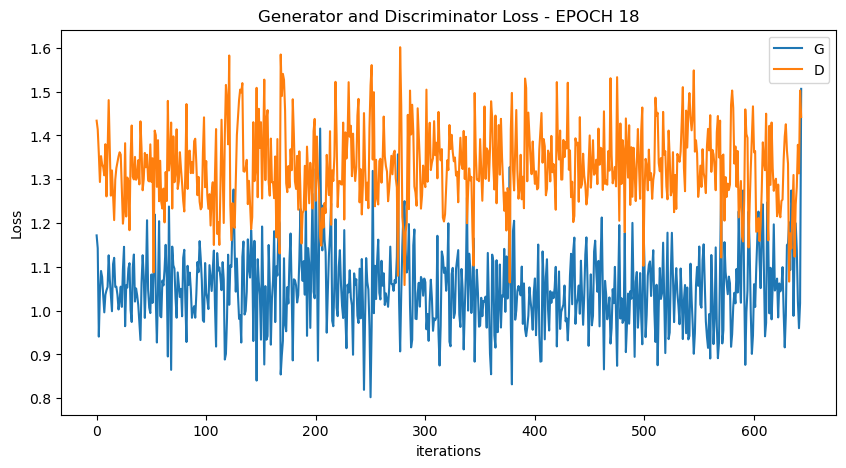

 50%|█████     | 322/644 [09:15<09:09,  1.71s/it]

[20/100][322/644] Loss_D: 1.3338 Loss_G: 1.0276 D(x): 0.4524 D(G(z)): 0.3988 / 0.3500


100%|██████████| 644/644 [18:29<00:00,  1.72s/it]

[20/100][644/644] Loss_D: 1.7058 Loss_G: 1.2407 D(x): 0.2215 D(G(z)): 0.2476 / 0.2611


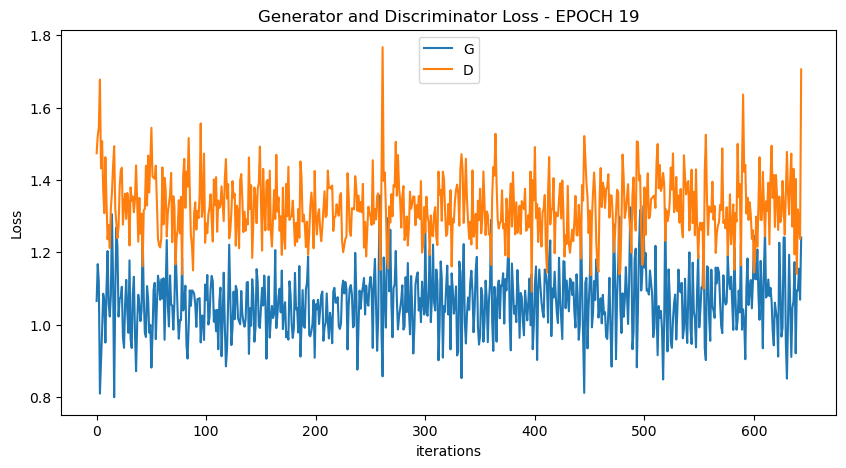

 50%|█████     | 322/644 [09:16<08:57,  1.67s/it]

[21/100][322/644] Loss_D: 1.3724 Loss_G: 0.9226 D(x): 0.3932 D(G(z)): 0.3386 / 0.3995


100%|██████████| 644/644 [18:29<00:00,  1.72s/it]

[21/100][644/644] Loss_D: 1.2316 Loss_G: 2.5526 D(x): 0.5222 D(G(z)): 0.4076 / 0.0614


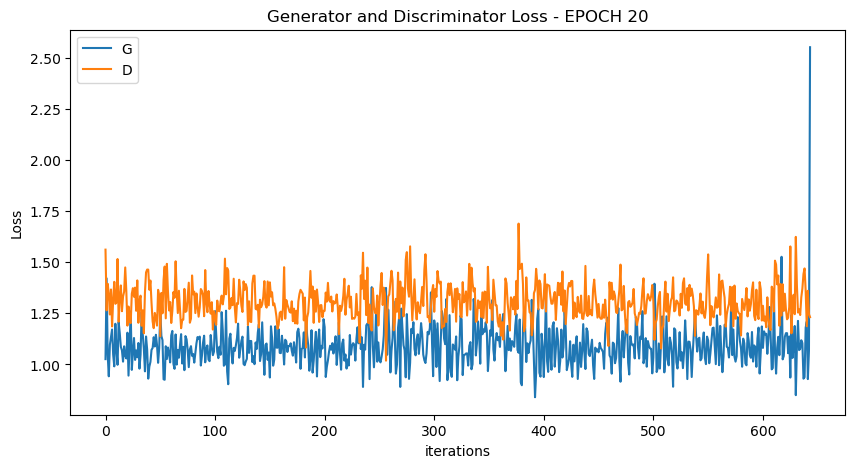

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


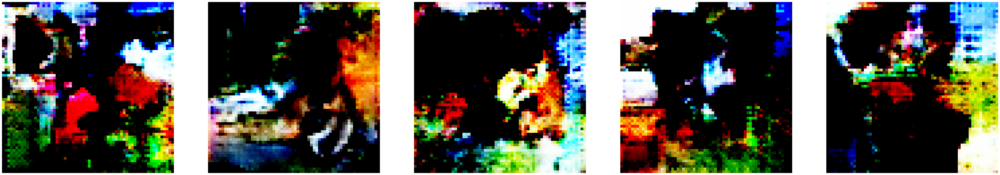

 50%|█████     | 322/644 [09:41<09:34,  1.78s/it]

[22/100][322/644] Loss_D: 1.2335 Loss_G: 1.1910 D(x): 0.4827 D(G(z)): 0.3591 / 0.2826


100%|██████████| 644/644 [19:00<00:00,  1.77s/it]

[22/100][644/644] Loss_D: 1.6528 Loss_G: 2.1943 D(x): 0.3425 D(G(z)): 0.4242 / 0.0887


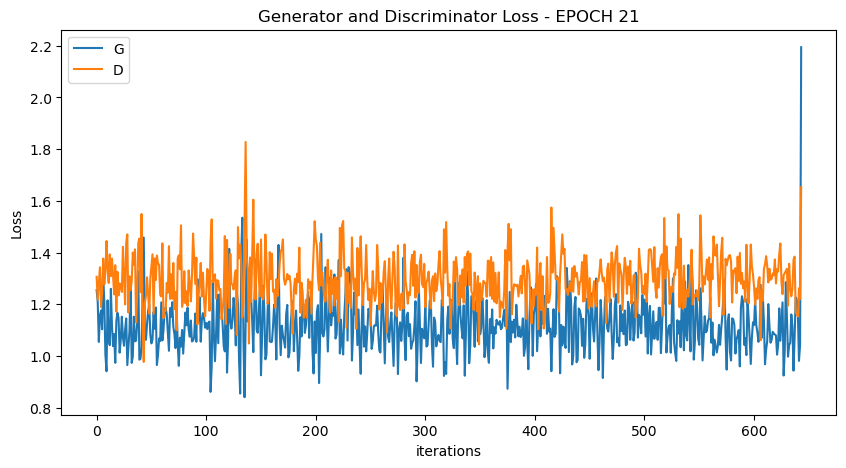

 50%|█████     | 322/644 [09:16<09:28,  1.77s/it]

[23/100][322/644] Loss_D: 1.3703 Loss_G: 1.0608 D(x): 0.4714 D(G(z)): 0.4322 / 0.3383


100%|██████████| 644/644 [18:30<00:00,  1.73s/it]

[23/100][644/644] Loss_D: 1.1279 Loss_G: 1.8557 D(x): 0.4169 D(G(z)): 0.2229 / 0.1315


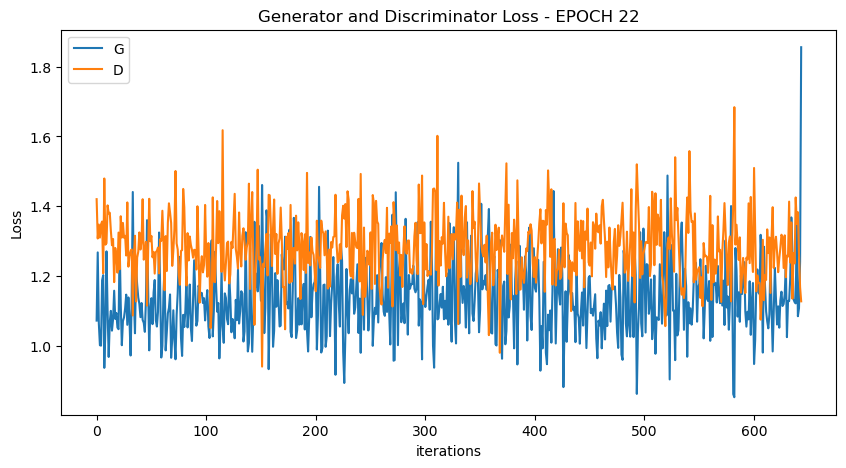

 50%|█████     | 322/644 [09:18<09:36,  1.79s/it]

[24/100][322/644] Loss_D: 1.2949 Loss_G: 1.3176 D(x): 0.4966 D(G(z)): 0.4103 / 0.2575


100%|██████████| 644/644 [18:34<00:00,  1.73s/it]

[24/100][644/644] Loss_D: 1.3494 Loss_G: 3.2536 D(x): 0.5294 D(G(z)): 0.4246 / 0.0403


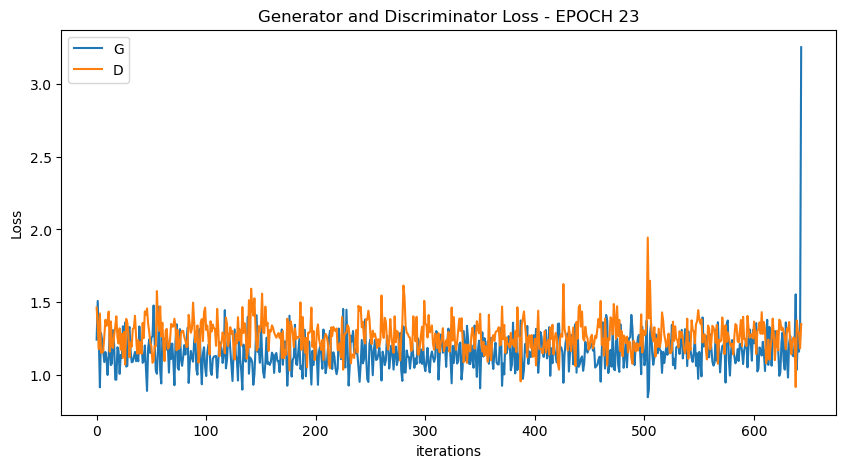

 50%|█████     | 322/644 [09:12<09:09,  1.71s/it]

[25/100][322/644] Loss_D: 1.2936 Loss_G: 1.0145 D(x): 0.4680 D(G(z)): 0.3706 / 0.3575


100%|██████████| 644/644 [18:25<00:00,  1.72s/it]

[25/100][644/644] Loss_D: 1.3605 Loss_G: 1.6912 D(x): 0.3359 D(G(z)): 0.2429 / 0.2197


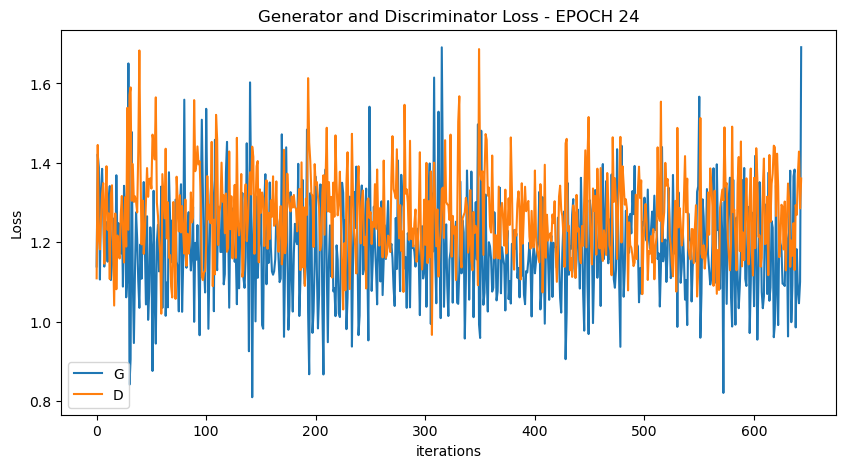

 50%|█████     | 322/644 [09:13<09:38,  1.80s/it]

[26/100][322/644] Loss_D: 1.2540 Loss_G: 1.1930 D(x): 0.5197 D(G(z)): 0.4089 / 0.2933


100%|██████████| 644/644 [18:22<00:00,  1.71s/it]

[26/100][644/644] Loss_D: 1.7771 Loss_G: 1.7595 D(x): 0.2281 D(G(z)): 0.3351 / 0.1530


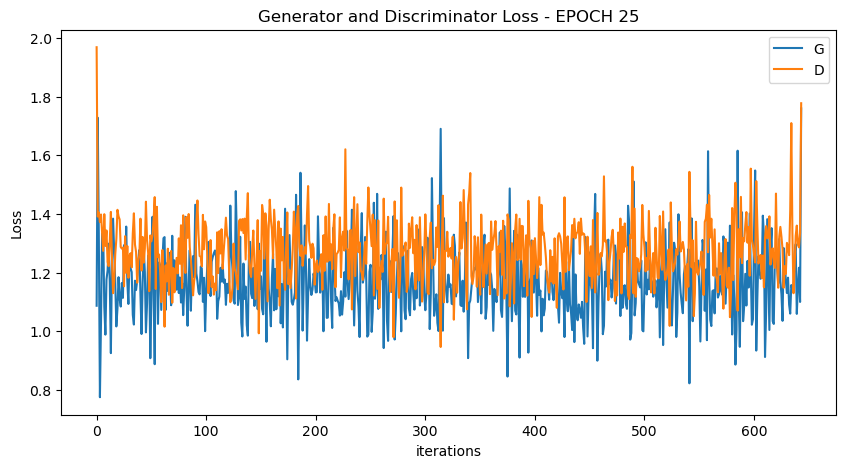

 50%|█████     | 322/644 [09:15<09:46,  1.82s/it]

[27/100][322/644] Loss_D: 1.2579 Loss_G: 1.0868 D(x): 0.4579 D(G(z)): 0.3478 / 0.3272


100%|██████████| 644/644 [18:28<00:00,  1.72s/it]

[27/100][644/644] Loss_D: 1.0936 Loss_G: 4.2034 D(x): 0.7083 D(G(z)): 0.4682 / 0.0096


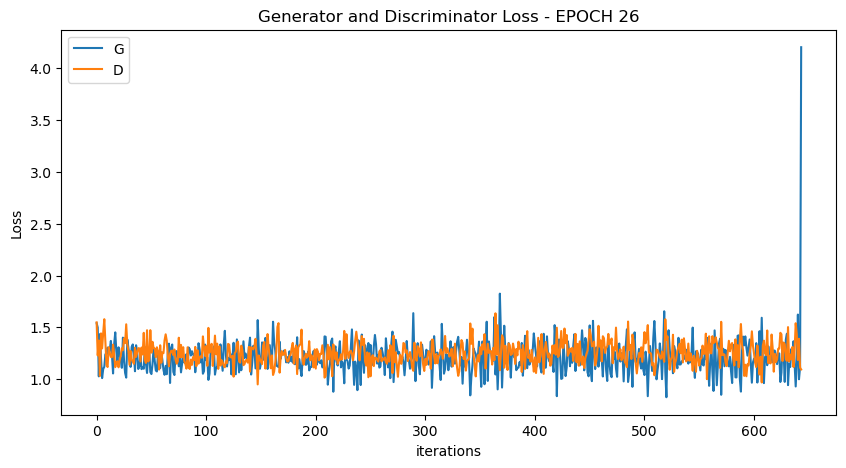

 50%|█████     | 322/644 [09:13<09:06,  1.70s/it]

[28/100][322/644] Loss_D: 1.4766 Loss_G: 1.3051 D(x): 0.4655 D(G(z)): 0.4651 / 0.2615


100%|██████████| 644/644 [18:46<00:00,  1.75s/it]

[28/100][644/644] Loss_D: 1.5813 Loss_G: 2.5725 D(x): 0.3024 D(G(z)): 0.3337 / 0.0666


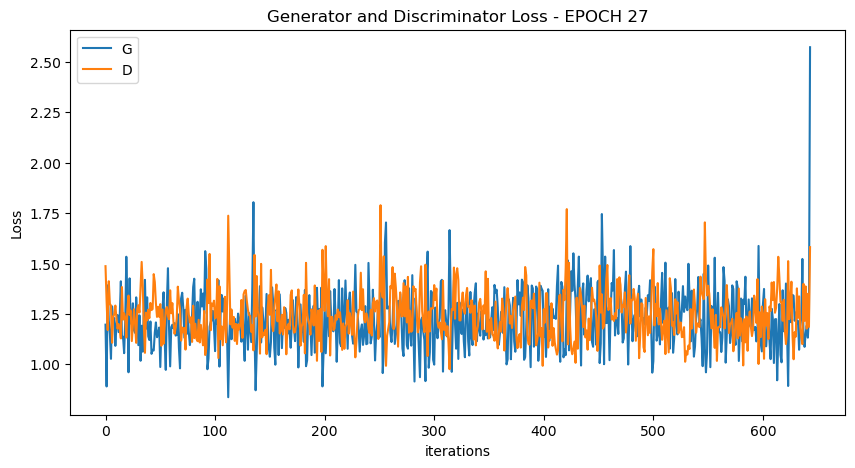

 50%|█████     | 322/644 [09:33<09:41,  1.81s/it]

[29/100][322/644] Loss_D: 1.1618 Loss_G: 1.1065 D(x): 0.5758 D(G(z)): 0.4153 / 0.3148


100%|██████████| 644/644 [18:53<00:00,  1.76s/it]

[29/100][644/644] Loss_D: 1.1847 Loss_G: 3.0055 D(x): 0.5146 D(G(z)): 0.3879 / 0.0432


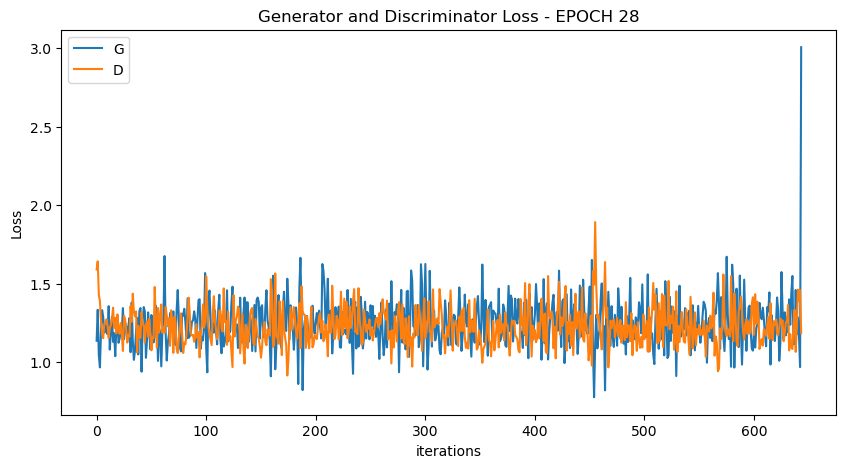

 50%|█████     | 322/644 [09:13<08:31,  1.59s/it]

[30/100][322/644] Loss_D: 1.2045 Loss_G: 1.3329 D(x): 0.5060 D(G(z)): 0.3660 / 0.2553


100%|██████████| 644/644 [18:29<00:00,  1.72s/it]

[30/100][644/644] Loss_D: 1.0903 Loss_G: 3.9489 D(x): 0.5858 D(G(z)): 0.3655 / 0.0165


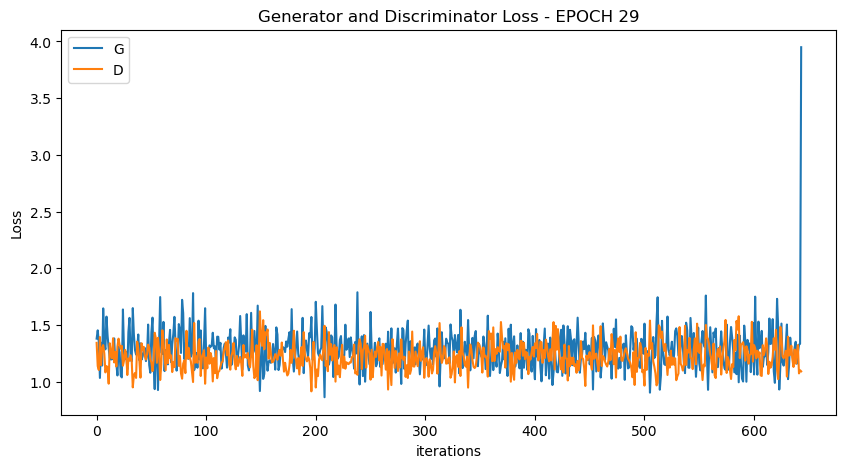

 50%|█████     | 322/644 [09:13<09:44,  1.82s/it]

[31/100][322/644] Loss_D: 1.2109 Loss_G: 1.3325 D(x): 0.4706 D(G(z)): 0.3180 / 0.2592


100%|██████████| 644/644 [18:25<00:00,  1.72s/it]

[31/100][644/644] Loss_D: 0.7728 Loss_G: 2.9389 D(x): 0.6672 D(G(z)): 0.2537 / 0.0431


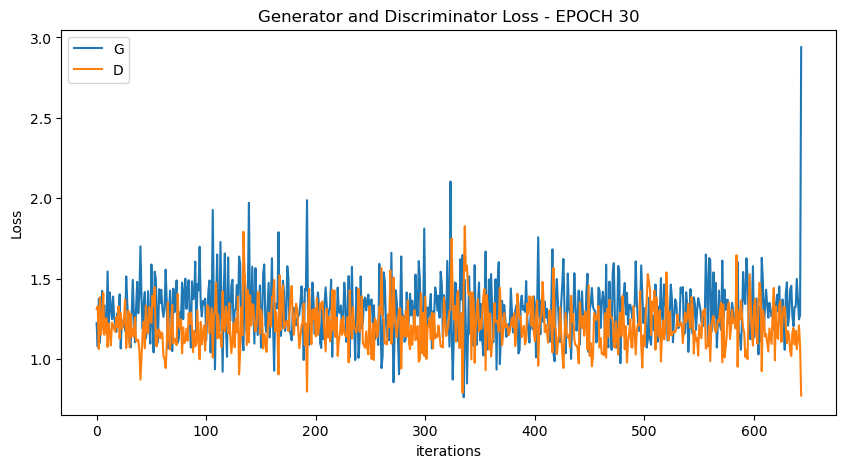

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


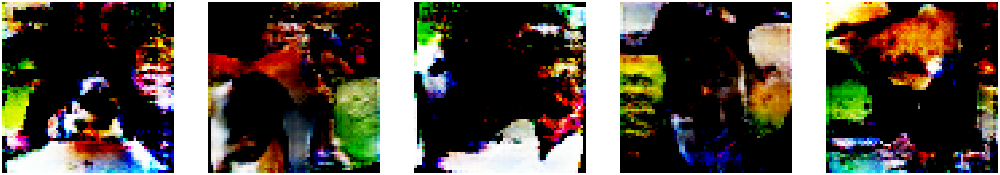

 50%|█████     | 322/644 [09:15<09:10,  1.71s/it]

[32/100][322/644] Loss_D: 1.3127 Loss_G: 1.2354 D(x): 0.4939 D(G(z)): 0.4013 / 0.2895


100%|██████████| 644/644 [18:28<00:00,  1.72s/it]

[32/100][644/644] Loss_D: 1.1421 Loss_G: 1.2248 D(x): 0.3634 D(G(z)): 0.1512 / 0.2670


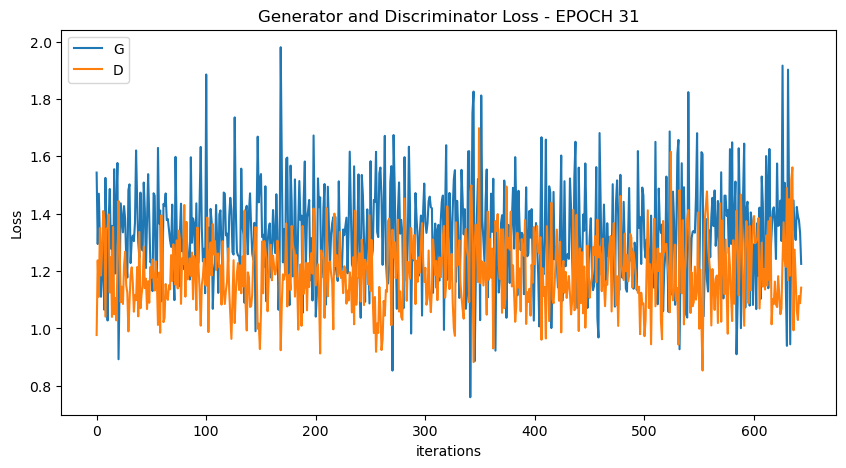

 50%|█████     | 322/644 [09:11<08:57,  1.67s/it]

[33/100][322/644] Loss_D: 1.1556 Loss_G: 1.2836 D(x): 0.6061 D(G(z)): 0.4291 / 0.2669


100%|██████████| 644/644 [18:23<00:00,  1.71s/it]

[33/100][644/644] Loss_D: 1.2789 Loss_G: 2.2416 D(x): 0.3439 D(G(z)): 0.1210 / 0.0906


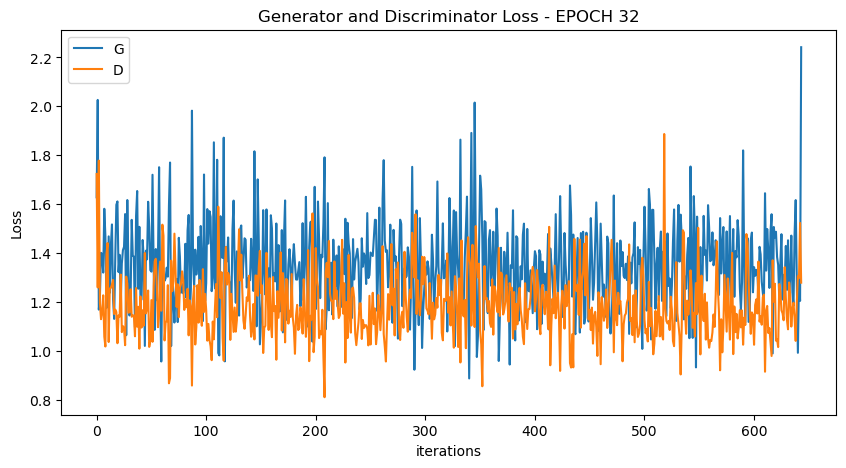

 50%|█████     | 322/644 [09:15<08:42,  1.62s/it]

[34/100][322/644] Loss_D: 0.8802 Loss_G: 1.4860 D(x): 0.5947 D(G(z)): 0.2507 / 0.2092


100%|██████████| 644/644 [18:31<00:00,  1.73s/it]

[34/100][644/644] Loss_D: 1.4059 Loss_G: 2.3490 D(x): 0.3351 D(G(z)): 0.2501 / 0.0846


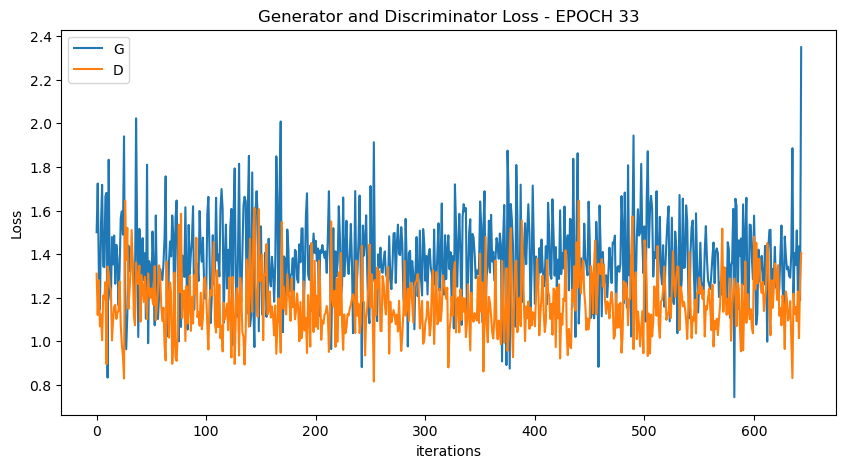

 50%|█████     | 322/644 [09:13<09:41,  1.81s/it]

[35/100][322/644] Loss_D: 1.2807 Loss_G: 1.1184 D(x): 0.4796 D(G(z)): 0.3449 / 0.3199


100%|██████████| 644/644 [18:29<00:00,  1.72s/it]

[35/100][644/644] Loss_D: 1.5057 Loss_G: 1.6811 D(x): 0.2567 D(G(z)): 0.0658 / 0.1577


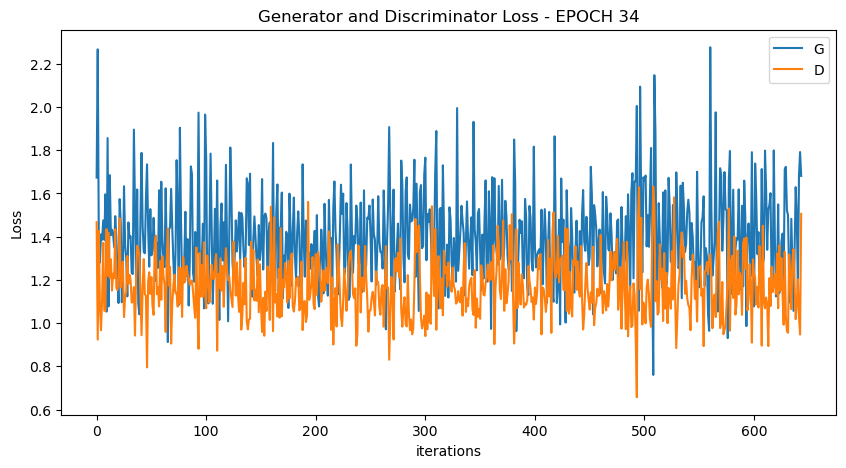

 50%|█████     | 322/644 [09:13<08:48,  1.64s/it]

[36/100][322/644] Loss_D: 1.1519 Loss_G: 1.3060 D(x): 0.6146 D(G(z)): 0.4146 / 0.2642


100%|██████████| 644/644 [18:23<00:00,  1.71s/it]

[36/100][644/644] Loss_D: 0.9906 Loss_G: 3.6441 D(x): 0.5928 D(G(z)): 0.3257 / 0.0204


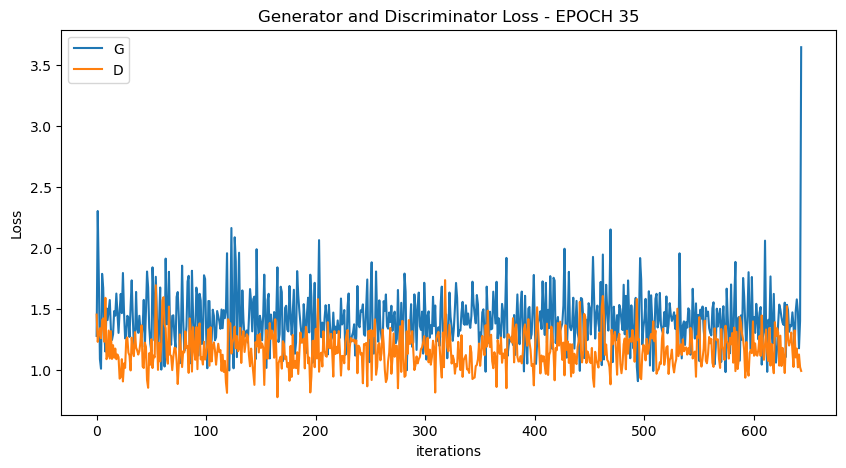

 50%|█████     | 322/644 [09:09<09:40,  1.80s/it]

[37/100][322/644] Loss_D: 1.1418 Loss_G: 1.4253 D(x): 0.5321 D(G(z)): 0.3129 / 0.2285


100%|██████████| 644/644 [18:15<00:00,  1.70s/it]


[37/100][644/644] Loss_D: 0.9269 Loss_G: 2.3698 D(x): 0.5683 D(G(z)): 0.2318 / 0.0773


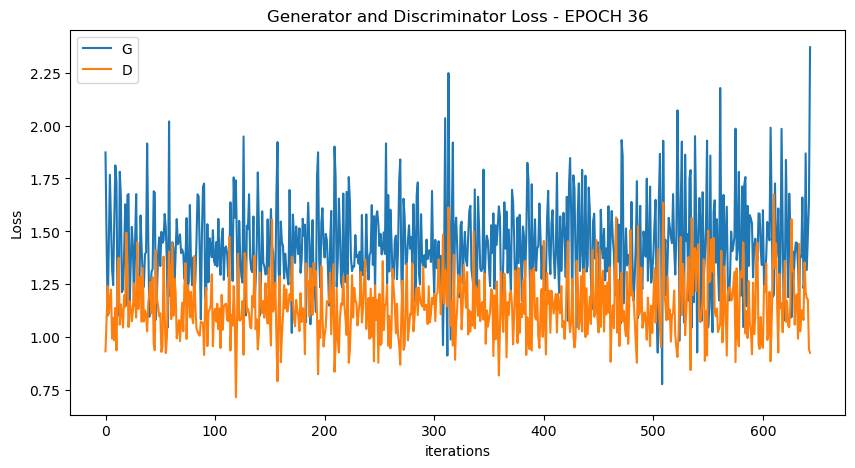

 50%|█████     | 322/644 [09:13<09:22,  1.75s/it]

[38/100][322/644] Loss_D: 1.0939 Loss_G: 1.4104 D(x): 0.5953 D(G(z)): 0.3474 / 0.2496


100%|██████████| 644/644 [18:26<00:00,  1.72s/it]

[38/100][644/644] Loss_D: 1.0961 Loss_G: 4.2259 D(x): 0.5959 D(G(z)): 0.3495 / 0.0116


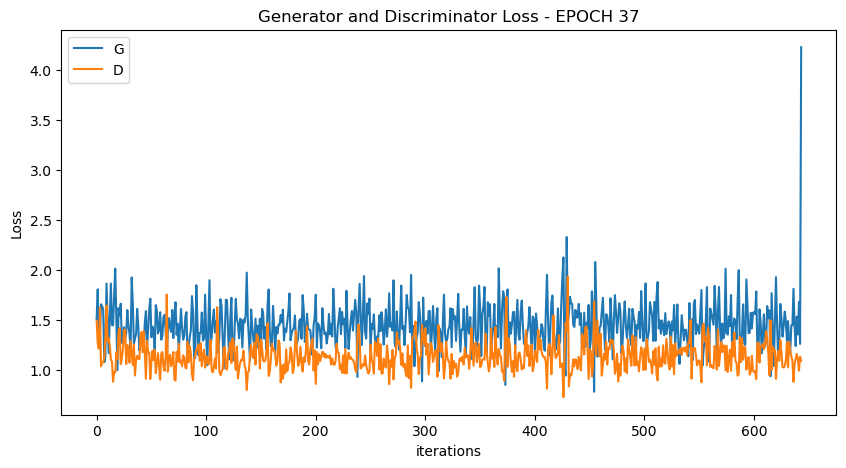

 50%|█████     | 322/644 [09:25<09:23,  1.75s/it]

[39/100][322/644] Loss_D: 1.1301 Loss_G: 1.6403 D(x): 0.5514 D(G(z)): 0.3458 / 0.1934


100%|██████████| 644/644 [18:31<00:00,  1.73s/it]

[39/100][644/644] Loss_D: 1.8399 Loss_G: 2.4420 D(x): 0.2017 D(G(z)): 0.2248 / 0.0936


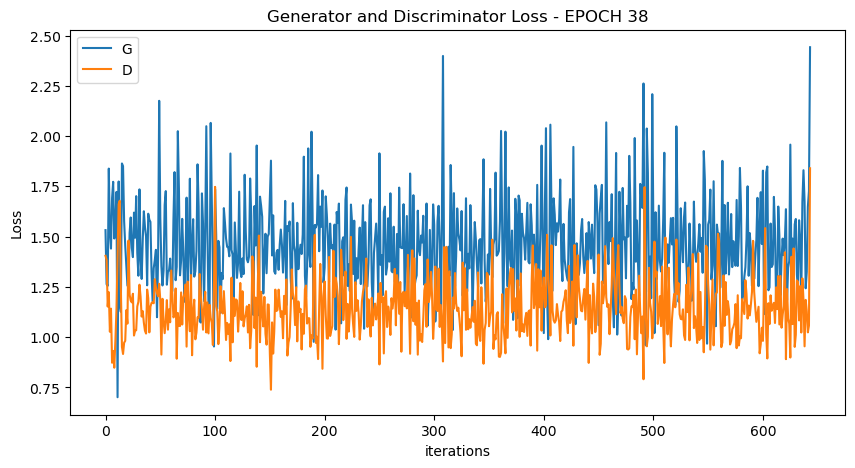

 50%|█████     | 322/644 [09:09<09:08,  1.70s/it]

[40/100][322/644] Loss_D: 0.9337 Loss_G: 1.3493 D(x): 0.6365 D(G(z)): 0.3021 / 0.2512


100%|██████████| 644/644 [18:16<00:00,  1.70s/it]

[40/100][644/644] Loss_D: 0.9788 Loss_G: 3.6189 D(x): 0.5794 D(G(z)): 0.2721 / 0.0246


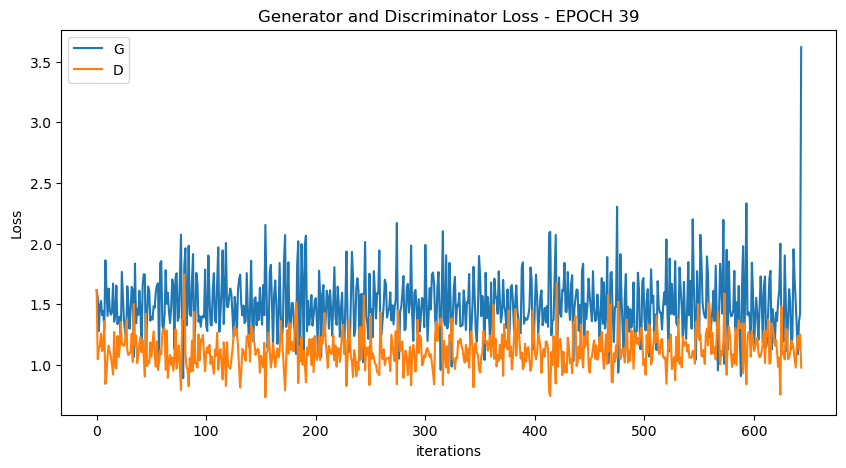

 50%|█████     | 322/644 [09:10<09:28,  1.76s/it]

[41/100][322/644] Loss_D: 1.0606 Loss_G: 1.4858 D(x): 0.6274 D(G(z)): 0.3546 / 0.2262


100%|██████████| 644/644 [18:18<00:00,  1.71s/it]

[41/100][644/644] Loss_D: 1.1218 Loss_G: 2.5502 D(x): 0.4157 D(G(z)): 0.2016 / 0.0977


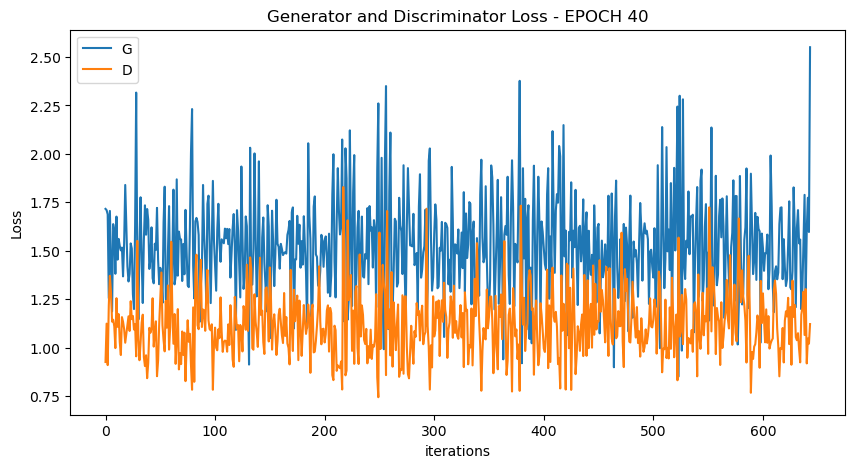

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


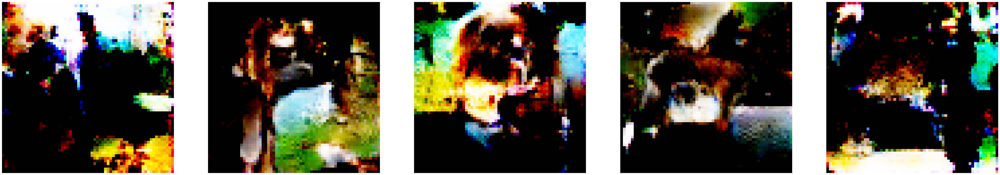

 50%|█████     | 322/644 [09:31<10:00,  1.86s/it]

[42/100][322/644] Loss_D: 1.2557 Loss_G: 1.5049 D(x): 0.5243 D(G(z)): 0.3941 / 0.2143


100%|██████████| 644/644 [19:03<00:00,  1.77s/it]

[42/100][644/644] Loss_D: 0.7889 Loss_G: 3.9684 D(x): 0.6586 D(G(z)): 0.2349 / 0.0168


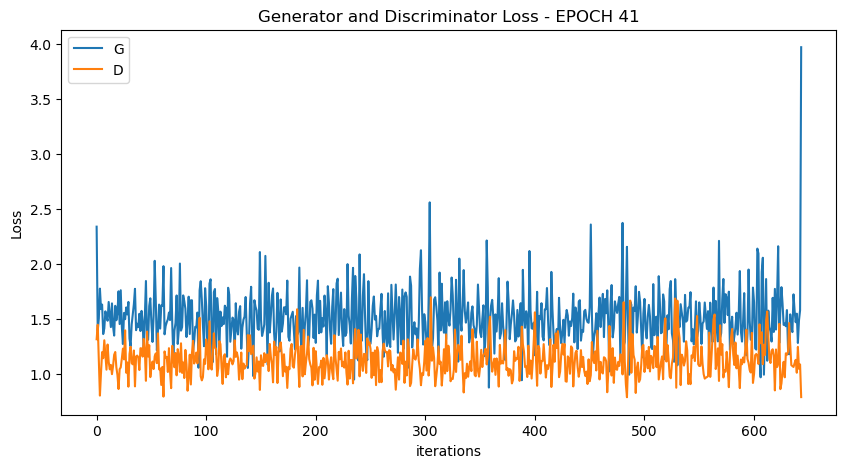

 50%|█████     | 322/644 [09:11<09:32,  1.78s/it]

[43/100][322/644] Loss_D: 1.3133 Loss_G: 1.5086 D(x): 0.7186 D(G(z)): 0.5276 / 0.2251


100%|██████████| 644/644 [18:19<00:00,  1.71s/it]

[43/100][644/644] Loss_D: 0.5948 Loss_G: 3.5376 D(x): 0.6813 D(G(z)): 0.0766 / 0.0240


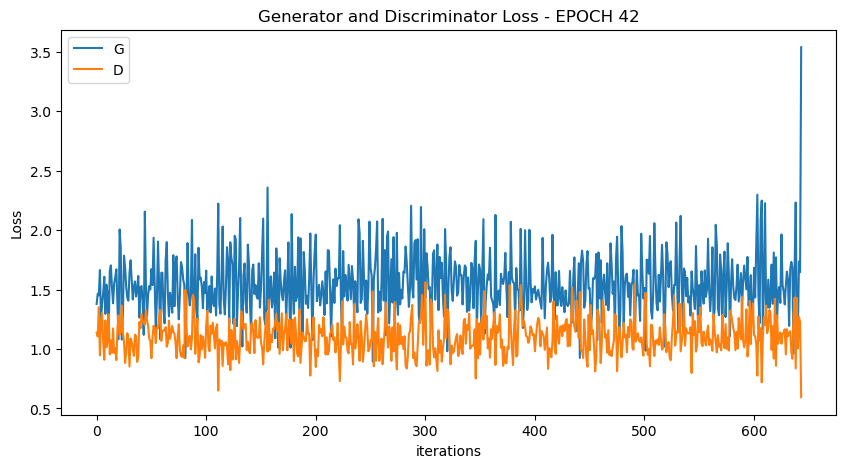

 50%|█████     | 322/644 [09:07<08:32,  1.59s/it]

[44/100][322/644] Loss_D: 1.1146 Loss_G: 1.8156 D(x): 0.7003 D(G(z)): 0.4179 / 0.1660


100%|██████████| 644/644 [18:15<00:00,  1.70s/it]

[44/100][644/644] Loss_D: 0.5464 Loss_G: 4.0386 D(x): 0.8684 D(G(z)): 0.1552 / 0.0187


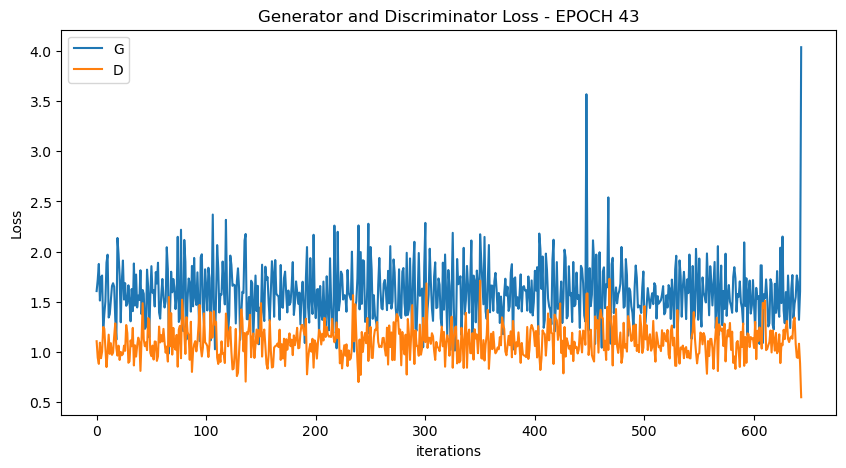

 50%|█████     | 322/644 [09:10<09:18,  1.73s/it]

[45/100][322/644] Loss_D: 0.9504 Loss_G: 1.8416 D(x): 0.6717 D(G(z)): 0.3253 / 0.1494


100%|██████████| 644/644 [18:18<00:00,  1.71s/it]

[45/100][644/644] Loss_D: 1.3638 Loss_G: 2.3868 D(x): 0.2886 D(G(z)): 0.1259 / 0.0859


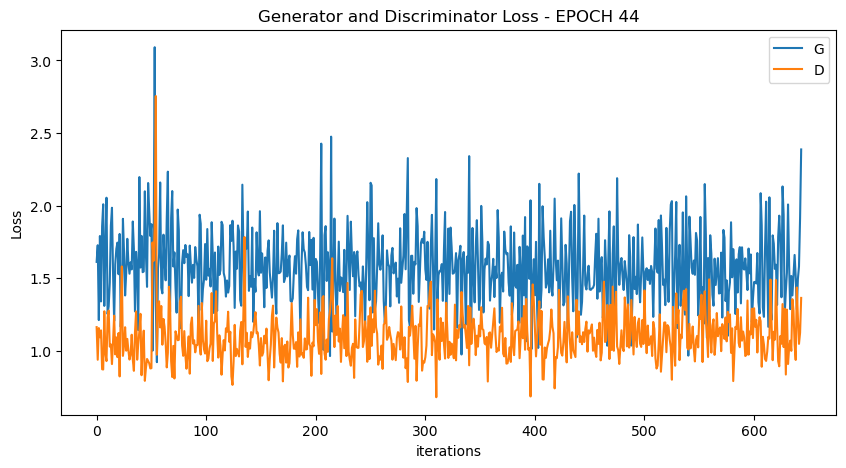

 50%|█████     | 322/644 [09:08<09:16,  1.73s/it]

[46/100][322/644] Loss_D: 1.2246 Loss_G: 1.3347 D(x): 0.4944 D(G(z)): 0.3296 / 0.2788


100%|██████████| 644/644 [18:16<00:00,  1.70s/it]

[46/100][644/644] Loss_D: 1.4244 Loss_G: 1.5056 D(x): 0.2830 D(G(z)): 0.1515 / 0.2214


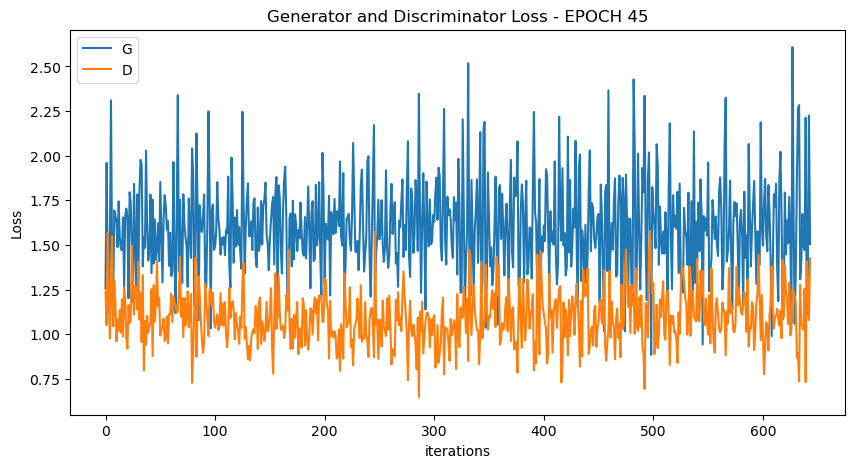

 50%|█████     | 322/644 [09:10<08:33,  1.60s/it]

[47/100][322/644] Loss_D: 1.1950 Loss_G: 1.5165 D(x): 0.5596 D(G(z)): 0.3512 / 0.2239


100%|██████████| 644/644 [18:18<00:00,  1.71s/it]


[47/100][644/644] Loss_D: 0.5097 Loss_G: 2.7582 D(x): 0.7209 D(G(z)): 0.0805 / 0.0477


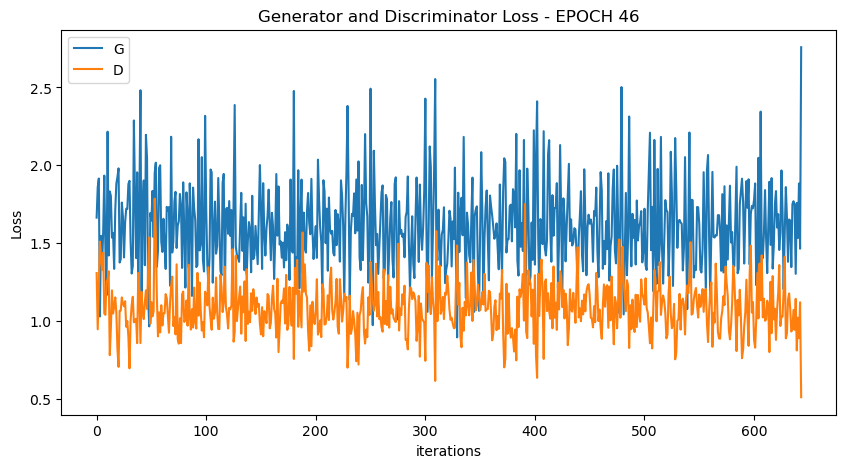

 50%|█████     | 322/644 [09:09<09:53,  1.84s/it]

[48/100][322/644] Loss_D: 0.9426 Loss_G: 1.6088 D(x): 0.5710 D(G(z)): 0.2449 / 0.1915


100%|██████████| 644/644 [18:16<00:00,  1.70s/it]

[48/100][644/644] Loss_D: 0.9931 Loss_G: 2.4287 D(x): 0.4935 D(G(z)): 0.1520 / 0.0717


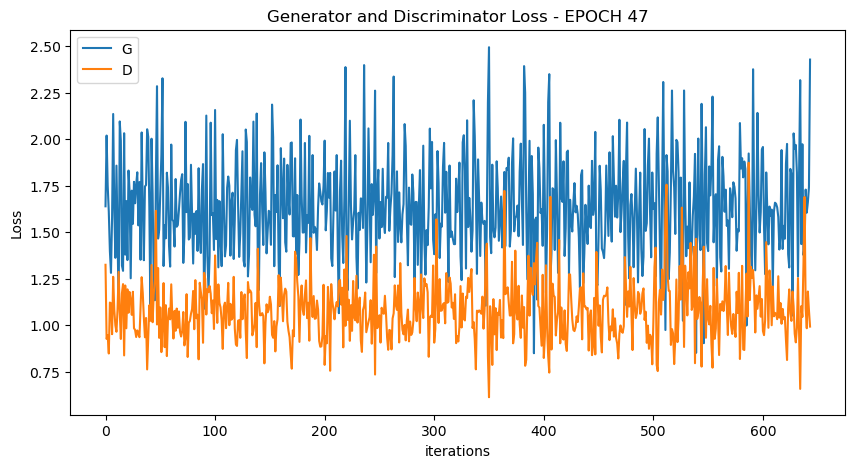

 50%|█████     | 322/644 [09:08<08:27,  1.58s/it]

[49/100][322/644] Loss_D: 1.0132 Loss_G: 1.2346 D(x): 0.5740 D(G(z)): 0.2952 / 0.2956


100%|██████████| 644/644 [18:11<00:00,  1.70s/it]

[49/100][644/644] Loss_D: 2.2806 Loss_G: 5.8883 D(x): 0.3752 D(G(z)): 0.6598 / 0.0040


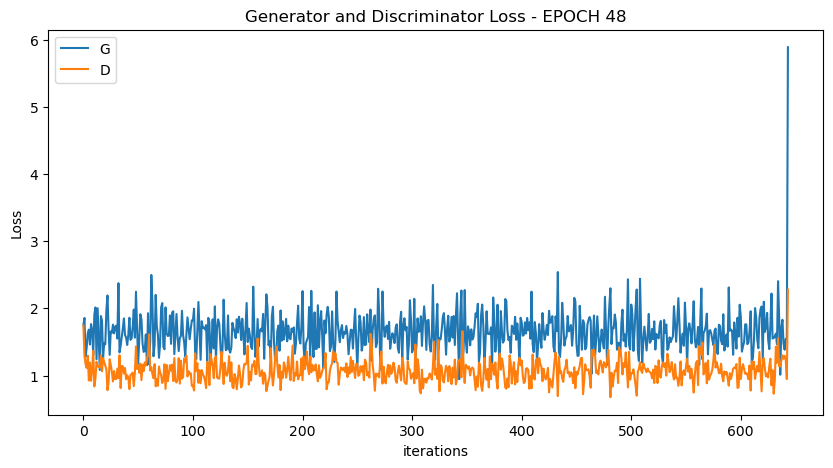

 50%|█████     | 322/644 [09:02<08:25,  1.57s/it]

[50/100][322/644] Loss_D: 1.0334 Loss_G: 0.9464 D(x): 0.5325 D(G(z)): 0.2337 / 0.3923


100%|██████████| 644/644 [18:06<00:00,  1.69s/it]

[50/100][644/644] Loss_D: 1.2640 Loss_G: 4.7306 D(x): 0.4806 D(G(z)): 0.3795 / 0.0077


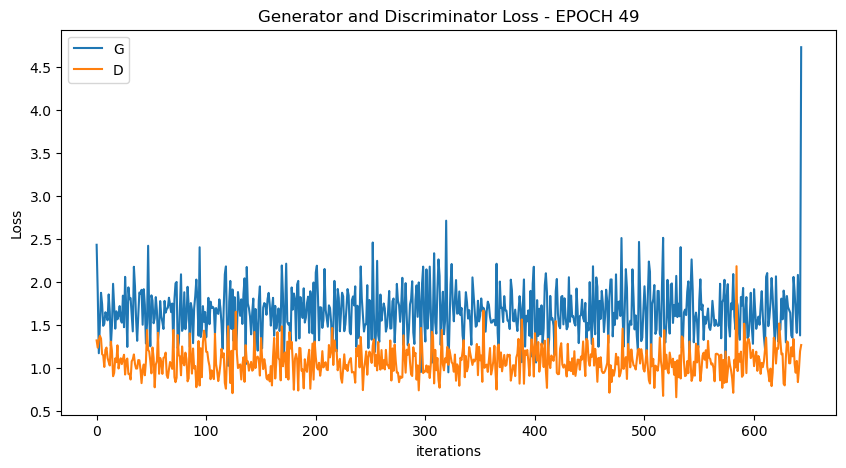

 50%|█████     | 322/644 [09:03<08:32,  1.59s/it]

[51/100][322/644] Loss_D: 1.0512 Loss_G: 1.6396 D(x): 0.7142 D(G(z)): 0.3865 / 0.1912


100%|██████████| 644/644 [18:05<00:00,  1.69s/it]

[51/100][644/644] Loss_D: 1.1216 Loss_G: 1.2176 D(x): 0.3541 D(G(z)): 0.1168 / 0.2990


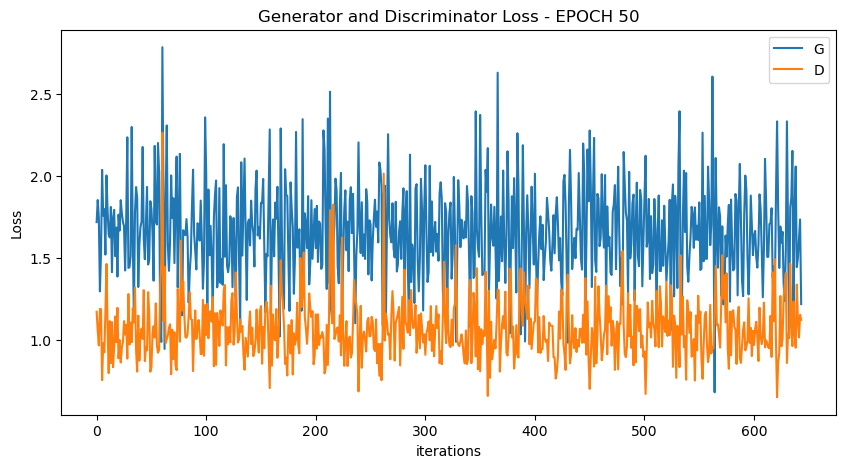

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


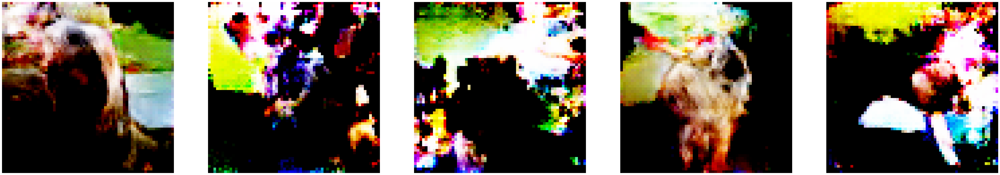

 50%|█████     | 322/644 [09:05<08:44,  1.63s/it]

[52/100][322/644] Loss_D: 1.2062 Loss_G: 1.5370 D(x): 0.4771 D(G(z)): 0.3089 / 0.2182


100%|██████████| 644/644 [18:07<00:00,  1.69s/it]

[52/100][644/644] Loss_D: 0.7128 Loss_G: 4.5385 D(x): 0.7214 D(G(z)): 0.2332 / 0.0071


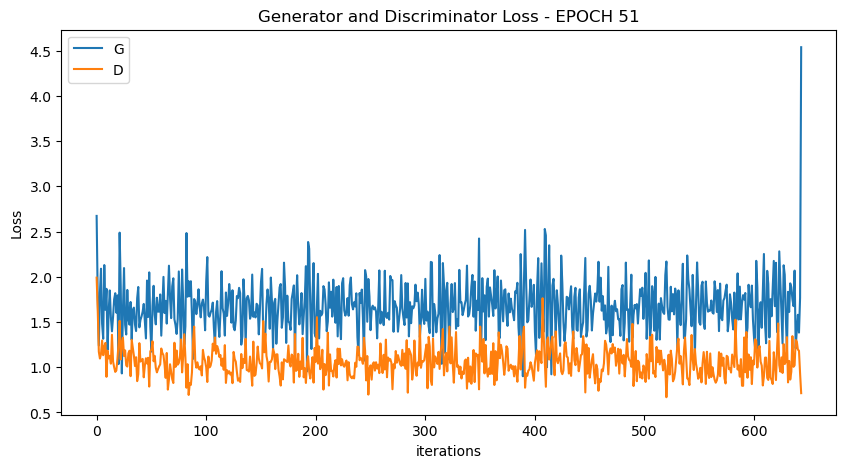

 50%|█████     | 322/644 [09:04<09:01,  1.68s/it]

[53/100][322/644] Loss_D: 0.9432 Loss_G: 1.7168 D(x): 0.6087 D(G(z)): 0.2508 / 0.1790


100%|██████████| 644/644 [18:36<00:00,  1.73s/it]

[53/100][644/644] Loss_D: 2.1428 Loss_G: 2.0715 D(x): 0.1353 D(G(z)): 0.2184 / 0.1163


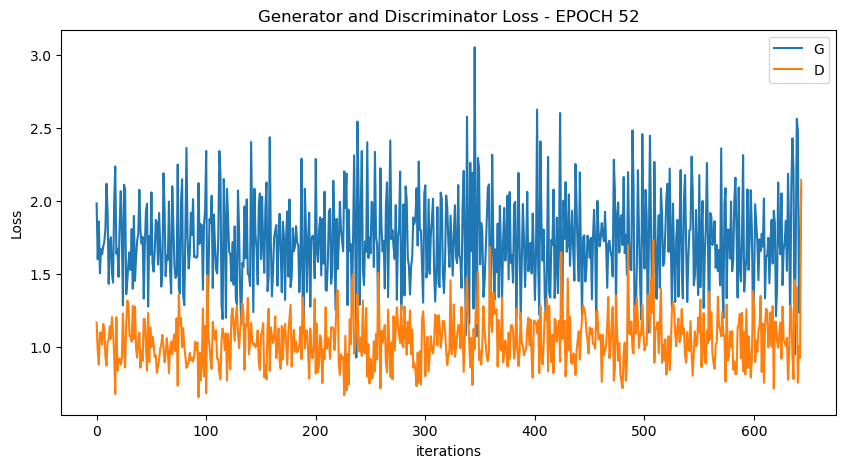

 50%|█████     | 322/644 [09:35<09:48,  1.83s/it]

[54/100][322/644] Loss_D: 1.0804 Loss_G: 1.8672 D(x): 0.7711 D(G(z)): 0.4281 / 0.1603


100%|██████████| 644/644 [18:57<00:00,  1.77s/it]

[54/100][644/644] Loss_D: 0.4074 Loss_G: 3.1981 D(x): 0.8186 D(G(z)): 0.0405 / 0.0293


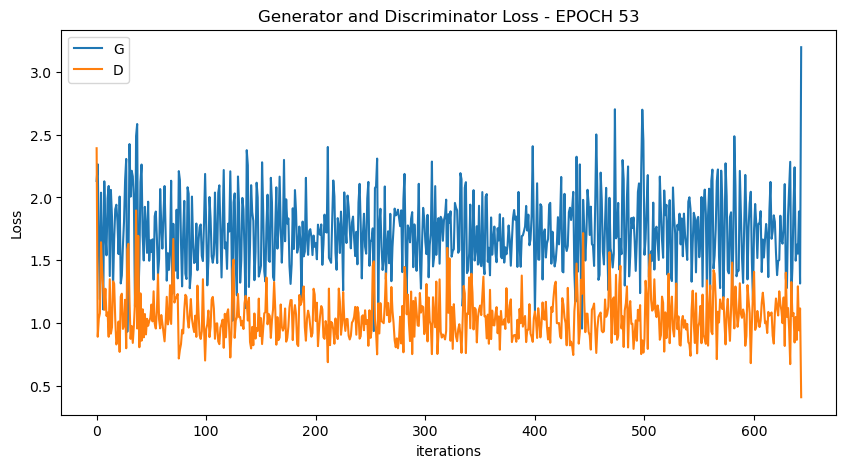

 50%|█████     | 322/644 [09:16<09:33,  1.78s/it]

[55/100][322/644] Loss_D: 1.0548 Loss_G: 1.5823 D(x): 0.4994 D(G(z)): 0.2180 / 0.2146


100%|██████████| 644/644 [18:26<00:00,  1.72s/it]

[55/100][644/644] Loss_D: 1.6549 Loss_G: 3.5049 D(x): 0.2891 D(G(z)): 0.3031 / 0.0562


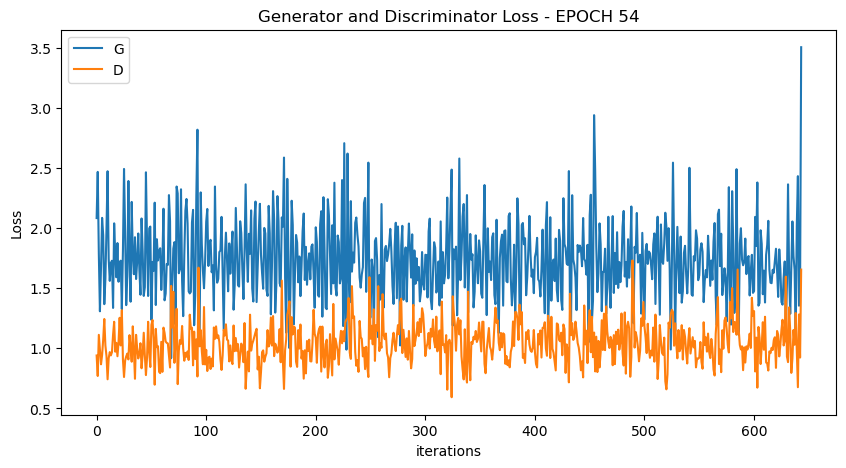

 50%|█████     | 322/644 [09:00<08:59,  1.68s/it]

[56/100][322/644] Loss_D: 1.0402 Loss_G: 1.8417 D(x): 0.6140 D(G(z)): 0.3080 / 0.1733


100%|██████████| 644/644 [17:50<00:00,  1.66s/it]

[56/100][644/644] Loss_D: 2.6402 Loss_G: 0.9038 D(x): 0.0666 D(G(z)): 0.1248 / 0.3957


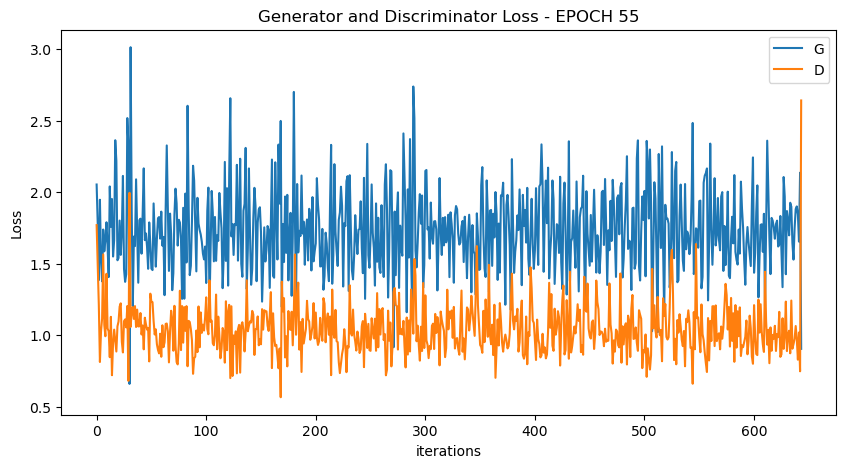

 50%|█████     | 322/644 [08:51<08:50,  1.65s/it]

[57/100][322/644] Loss_D: 0.9208 Loss_G: 1.6637 D(x): 0.5683 D(G(z)): 0.2274 / 0.1912


100%|██████████| 644/644 [18:11<00:00,  1.69s/it]

[57/100][644/644] Loss_D: 1.0021 Loss_G: 7.1636 D(x): 0.7043 D(G(z)): 0.4045 / 0.0013


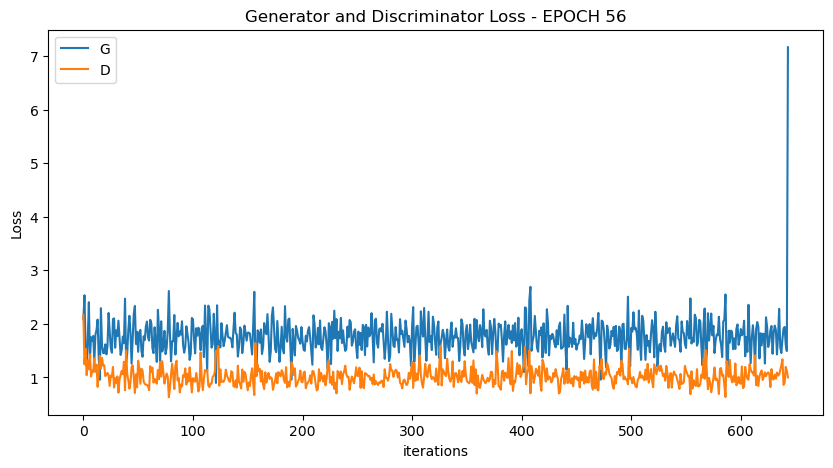

 50%|█████     | 322/644 [10:04<08:28,  1.58s/it]

[58/100][322/644] Loss_D: 1.0699 Loss_G: 2.0342 D(x): 0.6318 D(G(z)): 0.3447 / 0.1255


100%|██████████| 644/644 [19:31<00:00,  1.82s/it]

[58/100][644/644] Loss_D: 0.7570 Loss_G: 6.9300 D(x): 0.9501 D(G(z)): 0.3123 / 0.0013


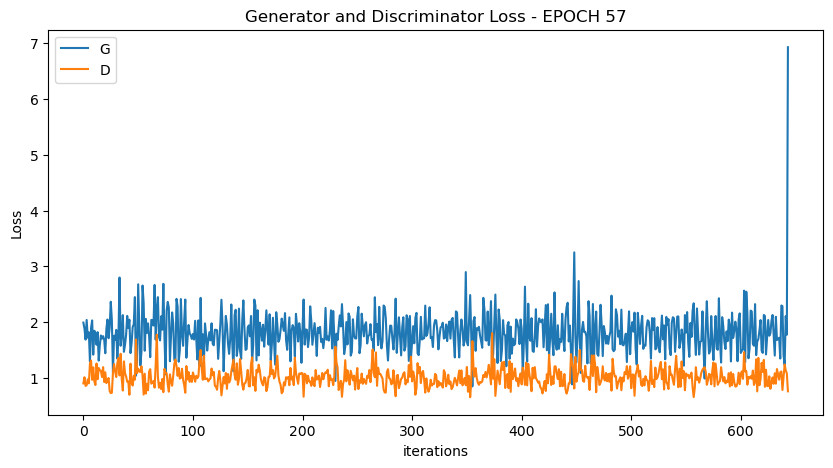

 50%|█████     | 322/644 [09:33<09:10,  1.71s/it]

[59/100][322/644] Loss_D: 0.8667 Loss_G: 1.8156 D(x): 0.6867 D(G(z)): 0.2567 / 0.1646


100%|██████████| 644/644 [18:17<00:00,  1.70s/it]

[59/100][644/644] Loss_D: 2.0961 Loss_G: 7.0479 D(x): 0.4281 D(G(z)): 0.4753 / 0.0028


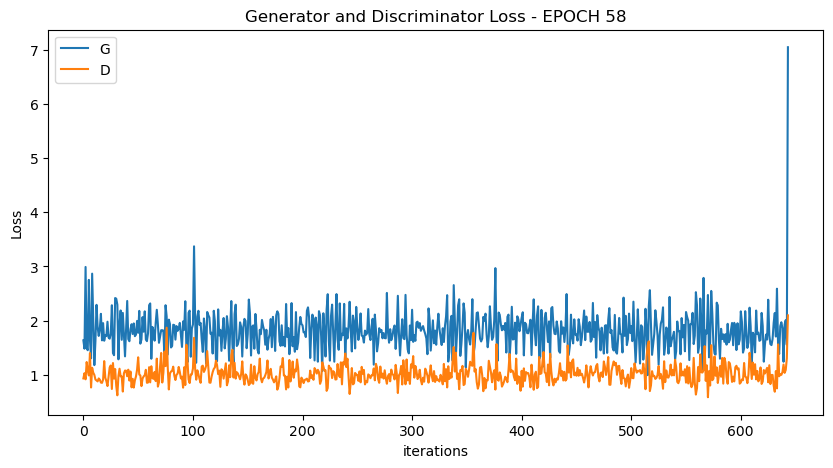

 50%|█████     | 322/644 [08:49<09:52,  1.84s/it]

[60/100][322/644] Loss_D: 1.2064 Loss_G: 2.0969 D(x): 0.5864 D(G(z)): 0.3811 / 0.1246


100%|██████████| 644/644 [18:14<00:00,  1.70s/it]

[60/100][644/644] Loss_D: 1.4289 Loss_G: 2.0932 D(x): 0.2912 D(G(z)): 0.1563 / 0.1136


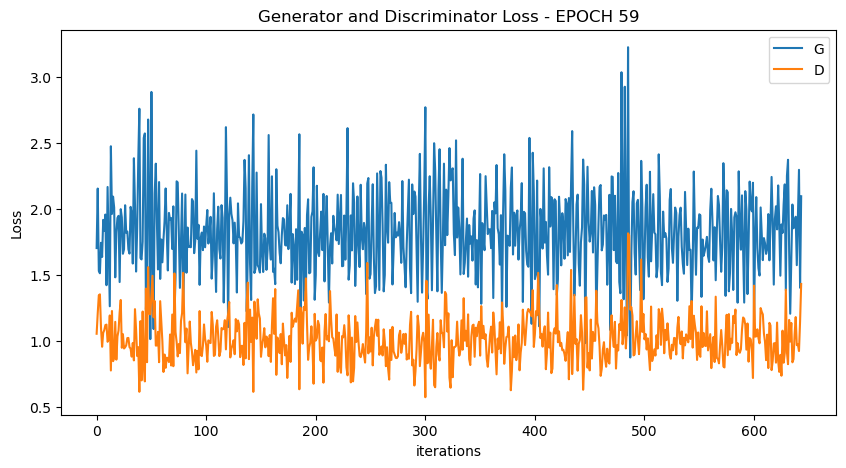

 50%|█████     | 322/644 [10:23<10:15,  1.91s/it]

[61/100][322/644] Loss_D: 1.0264 Loss_G: 1.8002 D(x): 0.5091 D(G(z)): 0.2266 / 0.1637


100%|██████████| 644/644 [20:25<00:00,  1.90s/it]

[61/100][644/644] Loss_D: 1.3885 Loss_G: 4.6794 D(x): 0.3949 D(G(z)): 0.2755 / 0.0400


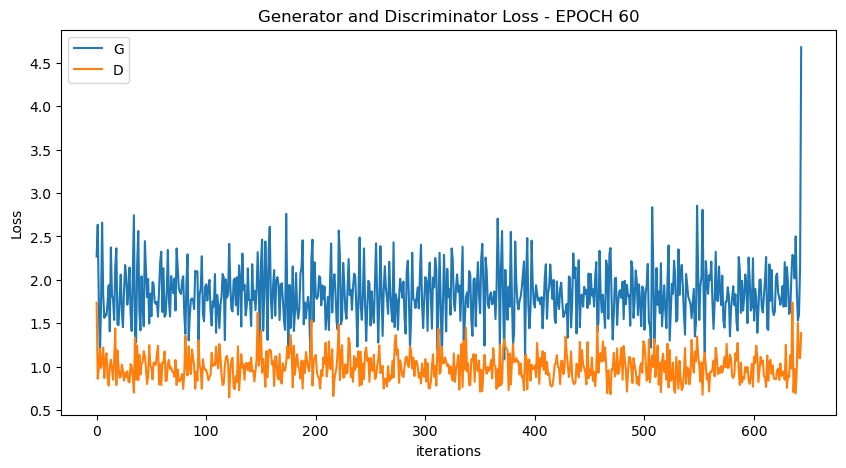

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


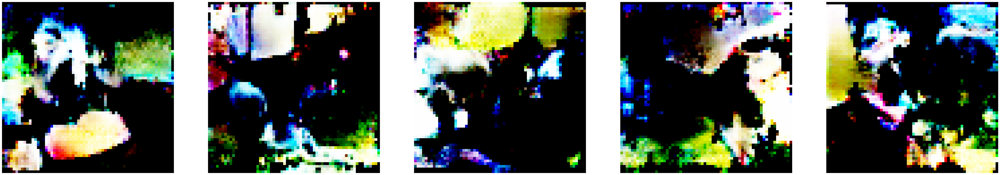

 50%|█████     | 322/644 [09:21<10:43,  2.00s/it]

[62/100][322/644] Loss_D: 0.8055 Loss_G: 2.0555 D(x): 0.5736 D(G(z)): 0.1219 / 0.1274


100%|██████████| 644/644 [19:13<00:00,  1.79s/it]

[62/100][644/644] Loss_D: 1.2451 Loss_G: 7.5750 D(x): 0.6257 D(G(z)): 0.4286 / 0.0005


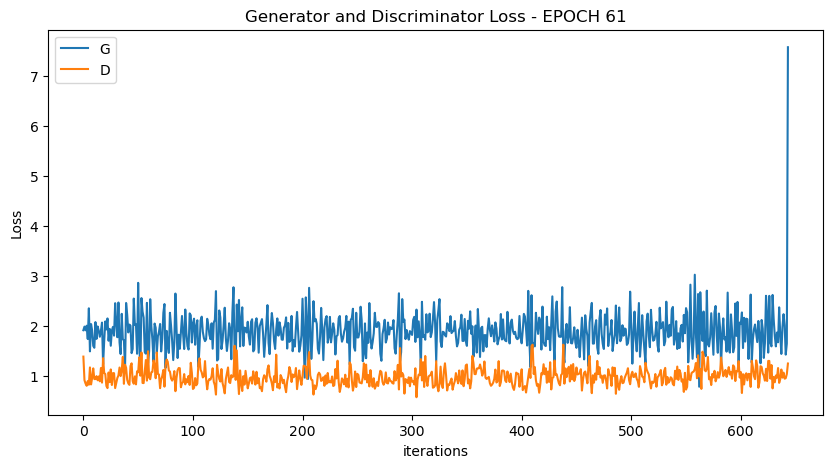

 50%|█████     | 322/644 [09:29<08:38,  1.61s/it]

[63/100][322/644] Loss_D: 0.9638 Loss_G: 1.6007 D(x): 0.5356 D(G(z)): 0.2018 / 0.2077


100%|██████████| 644/644 [19:22<00:00,  1.81s/it]

[63/100][644/644] Loss_D: 1.0717 Loss_G: 7.9748 D(x): 0.7863 D(G(z)): 0.4243 / 0.0016


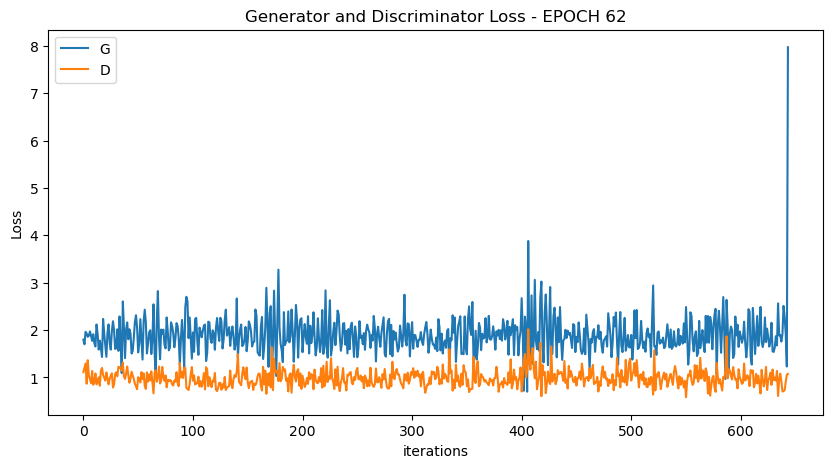

 50%|█████     | 322/644 [09:43<09:42,  1.81s/it]

[64/100][322/644] Loss_D: 0.9118 Loss_G: 1.7662 D(x): 0.4919 D(G(z)): 0.0922 / 0.1791


100%|██████████| 644/644 [19:22<00:00,  1.81s/it]

[64/100][644/644] Loss_D: 0.6963 Loss_G: 6.1753 D(x): 0.8051 D(G(z)): 0.2721 / 0.0024


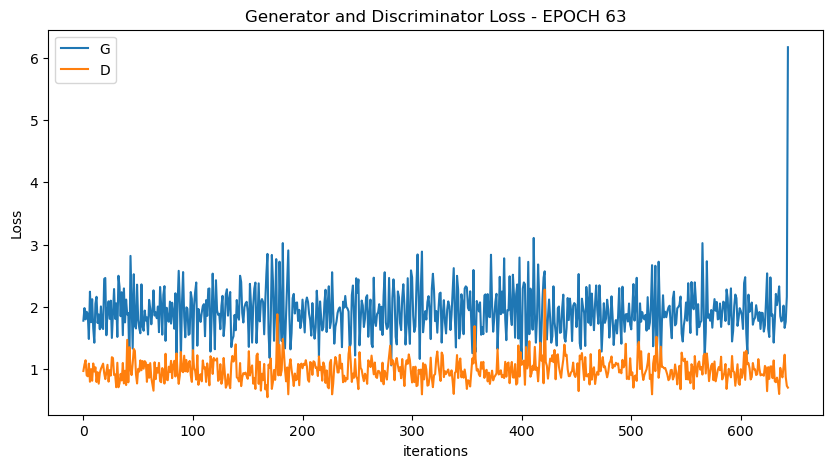

 50%|█████     | 322/644 [09:22<08:54,  1.66s/it]

[65/100][322/644] Loss_D: 1.1770 Loss_G: 1.9269 D(x): 0.4262 D(G(z)): 0.1070 / 0.1631


100%|██████████| 644/644 [19:11<00:00,  1.79s/it]

[65/100][644/644] Loss_D: 1.4173 Loss_G: 5.4689 D(x): 0.4017 D(G(z)): 0.2940 / 0.0588


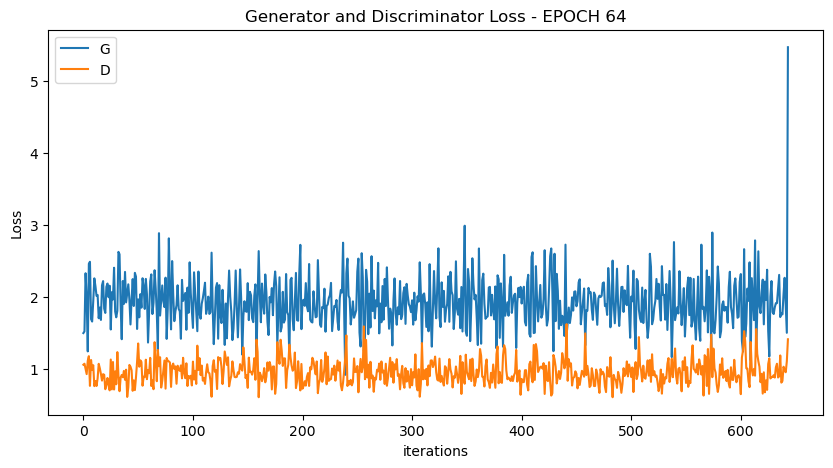

 50%|█████     | 322/644 [10:21<10:47,  2.01s/it]

[66/100][322/644] Loss_D: 1.5678 Loss_G: 3.3119 D(x): 0.8229 D(G(z)): 0.6019 / 0.0337


100%|██████████| 644/644 [20:04<00:00,  1.87s/it]

[66/100][644/644] Loss_D: 0.8276 Loss_G: 2.1780 D(x): 0.5106 D(G(z)): 0.0587 / 0.0991


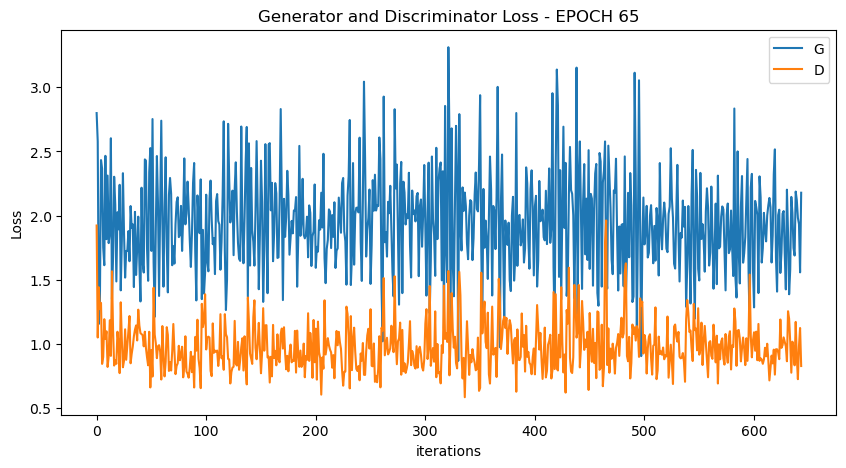

 50%|█████     | 322/644 [09:54<10:11,  1.90s/it]

[67/100][322/644] Loss_D: 1.0177 Loss_G: 1.9393 D(x): 0.7536 D(G(z)): 0.3967 / 0.1495


100%|██████████| 644/644 [20:19<00:00,  1.89s/it]


[67/100][644/644] Loss_D: 2.8748 Loss_G: 4.5516 D(x): 0.0876 D(G(z)): 0.3151 / 0.0275


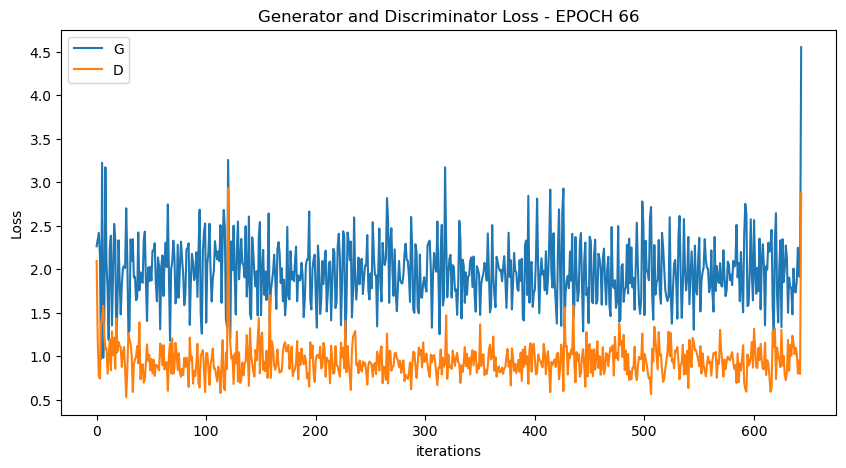

 50%|█████     | 322/644 [13:08<19:54,  3.71s/it]

[68/100][322/644] Loss_D: 0.7074 Loss_G: 2.4987 D(x): 0.8188 D(G(z)): 0.2481 / 0.0792


100%|██████████| 644/644 [24:58<00:00,  2.33s/it]

[68/100][644/644] Loss_D: 3.7896 Loss_G: 1.4540 D(x): 0.0215 D(G(z)): 0.0148 / 0.2511


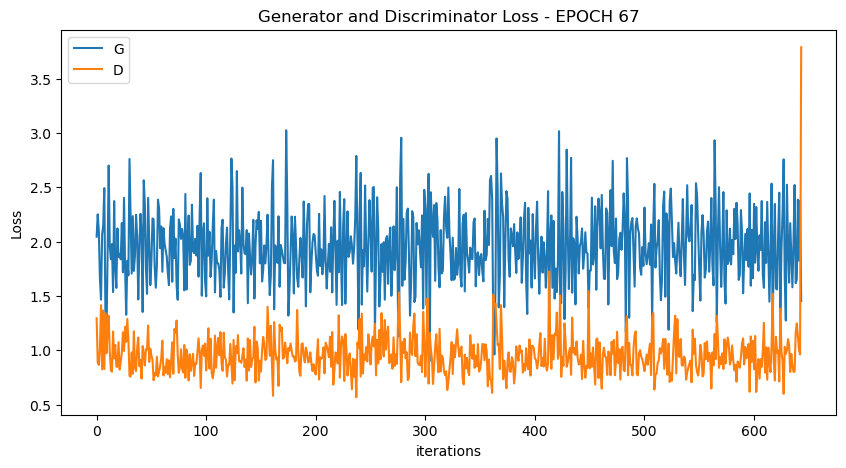

 50%|█████     | 322/644 [11:15<11:10,  2.08s/it]

[69/100][322/644] Loss_D: 0.7951 Loss_G: 1.8663 D(x): 0.7372 D(G(z)): 0.2380 / 0.1634


100%|██████████| 644/644 [21:56<00:00,  2.04s/it]

[69/100][644/644] Loss_D: 1.8229 Loss_G: 1.6939 D(x): 0.1501 D(G(z)): 0.0854 / 0.2084


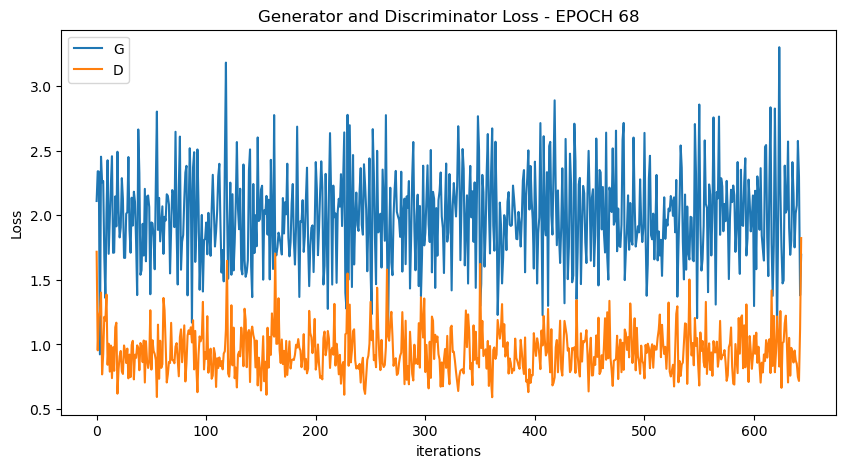

 50%|█████     | 322/644 [10:15<10:44,  2.00s/it]

[70/100][322/644] Loss_D: 0.8227 Loss_G: 1.9255 D(x): 0.7294 D(G(z)): 0.2604 / 0.1680


100%|██████████| 644/644 [20:28<00:00,  1.91s/it]

[70/100][644/644] Loss_D: 0.9617 Loss_G: 2.2101 D(x): 0.4368 D(G(z)): 0.0498 / 0.0877


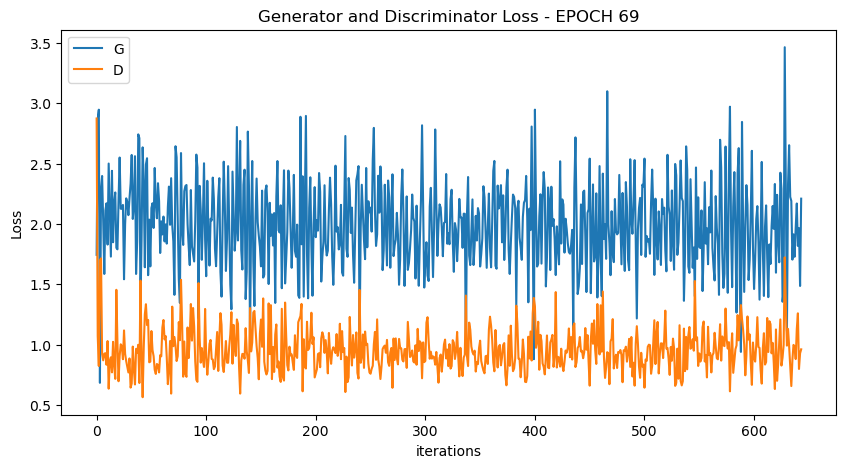

 50%|█████     | 322/644 [10:13<10:10,  1.90s/it]

[71/100][322/644] Loss_D: 0.7417 Loss_G: 2.0266 D(x): 0.7369 D(G(z)): 0.2217 / 0.1273


100%|██████████| 644/644 [20:25<00:00,  1.90s/it]

[71/100][644/644] Loss_D: 1.0658 Loss_G: 3.7316 D(x): 0.4895 D(G(z)): 0.1108 / 0.0199


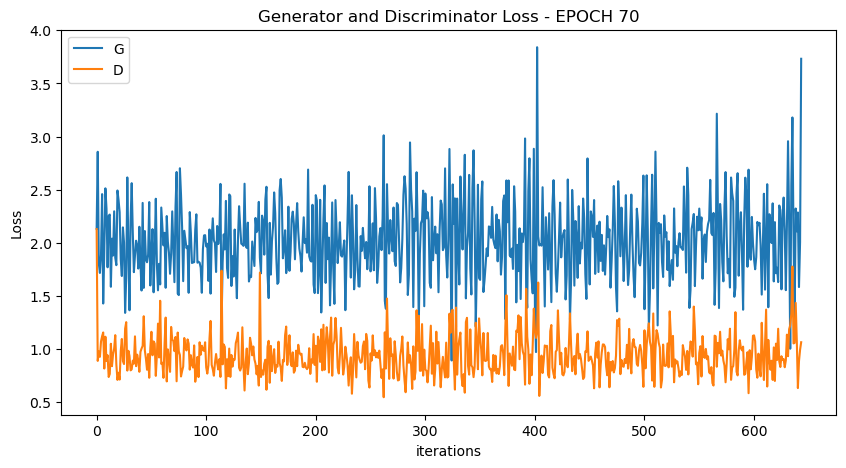

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


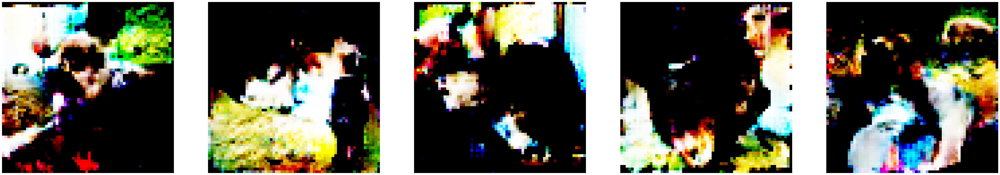

 50%|█████     | 322/644 [10:13<10:19,  1.92s/it]

[72/100][322/644] Loss_D: 0.8835 Loss_G: 2.7339 D(x): 0.7482 D(G(z)): 0.2981 / 0.0575


100%|██████████| 644/644 [20:25<00:00,  1.90s/it]

[72/100][644/644] Loss_D: 1.7065 Loss_G: 3.5190 D(x): 0.2710 D(G(z)): 0.2553 / 0.0556


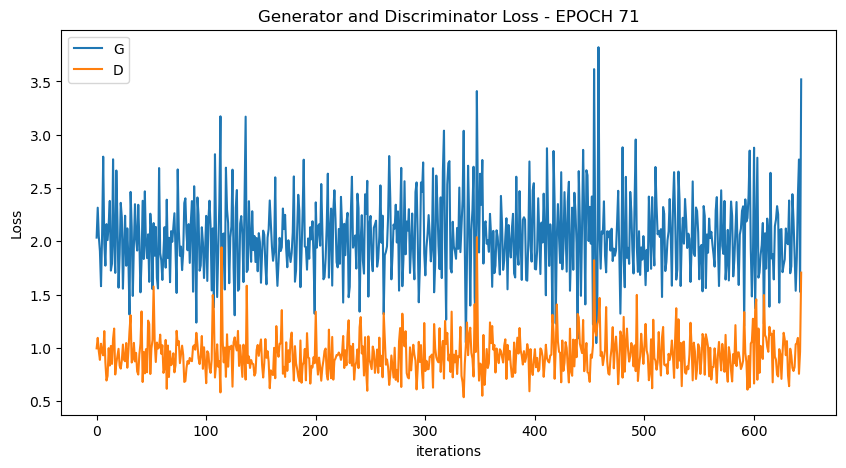

 50%|█████     | 322/644 [10:21<10:46,  2.01s/it]

[73/100][322/644] Loss_D: 0.6715 Loss_G: 2.6253 D(x): 0.6878 D(G(z)): 0.1418 / 0.0809


100%|██████████| 644/644 [20:35<00:00,  1.92s/it]

[73/100][644/644] Loss_D: 1.7913 Loss_G: 1.5616 D(x): 0.2181 D(G(z)): 0.0867 / 0.1823


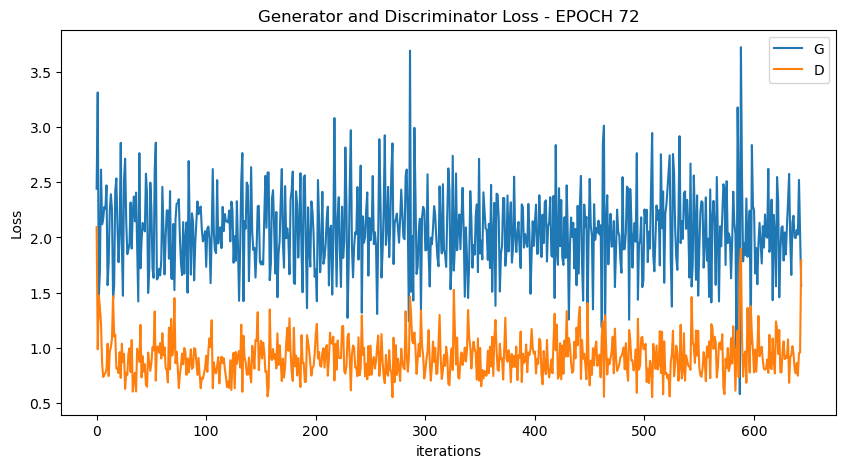

 50%|█████     | 322/644 [10:13<10:18,  1.92s/it]

[74/100][322/644] Loss_D: 1.2224 Loss_G: 1.9948 D(x): 0.4562 D(G(z)): 0.2418 / 0.1435


100%|██████████| 644/644 [20:28<00:00,  1.91s/it]

[74/100][644/644] Loss_D: 1.0362 Loss_G: 2.7156 D(x): 0.5133 D(G(z)): 0.2410 / 0.1055


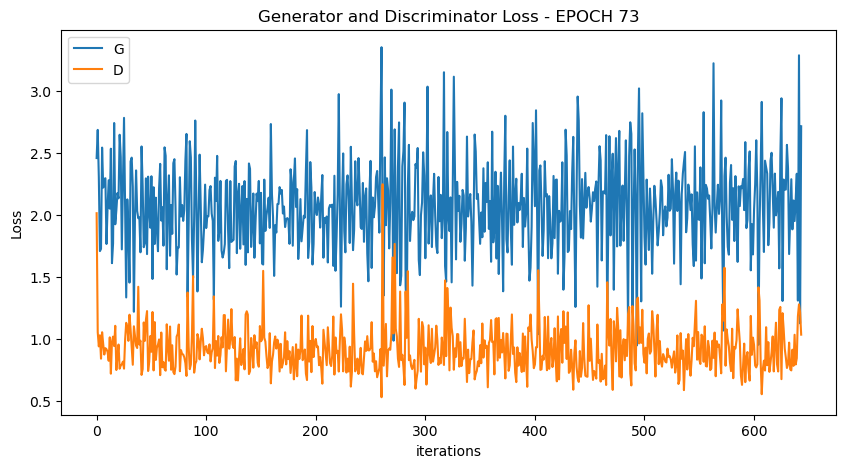

 50%|█████     | 322/644 [10:05<10:22,  1.93s/it]

[75/100][322/644] Loss_D: 0.9851 Loss_G: 2.0418 D(x): 0.6449 D(G(z)): 0.2974 / 0.1354


100%|██████████| 644/644 [20:07<00:00,  1.88s/it]

[75/100][644/644] Loss_D: 1.3737 Loss_G: 7.8137 D(x): 0.4405 D(G(z)): 0.3320 / 0.0016


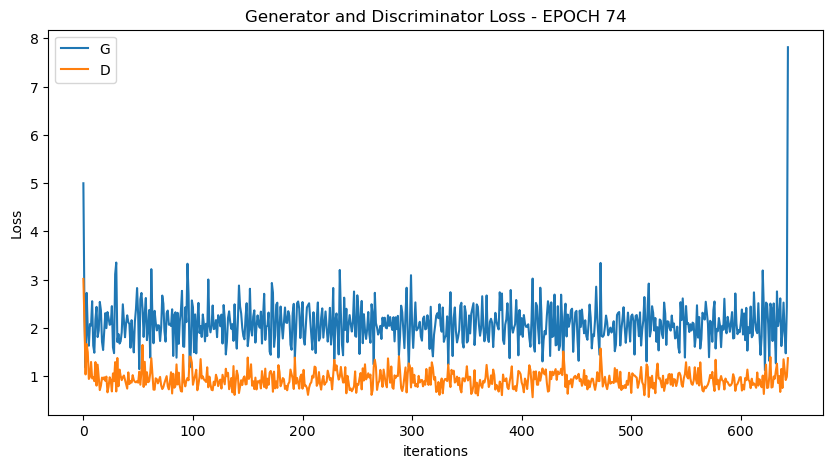

 50%|█████     | 322/644 [10:08<10:03,  1.87s/it]

[76/100][322/644] Loss_D: 0.7949 Loss_G: 2.0167 D(x): 0.7245 D(G(z)): 0.2368 / 0.1333


100%|██████████| 644/644 [20:10<00:00,  1.88s/it]

[76/100][644/644] Loss_D: 0.7917 Loss_G: 3.5739 D(x): 0.5453 D(G(z)): 0.1328 / 0.0301


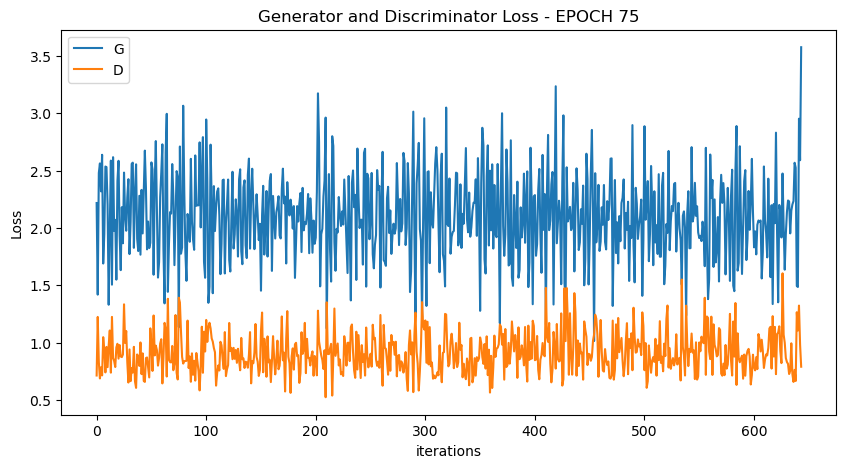

 50%|█████     | 322/644 [10:03<09:49,  1.83s/it]

[77/100][322/644] Loss_D: 0.8448 Loss_G: 2.2145 D(x): 0.8674 D(G(z)): 0.3366 / 0.1133


100%|██████████| 644/644 [20:09<00:00,  1.88s/it]

[77/100][644/644] Loss_D: 0.7700 Loss_G: 4.8387 D(x): 0.6516 D(G(z)): 0.2278 / 0.0094


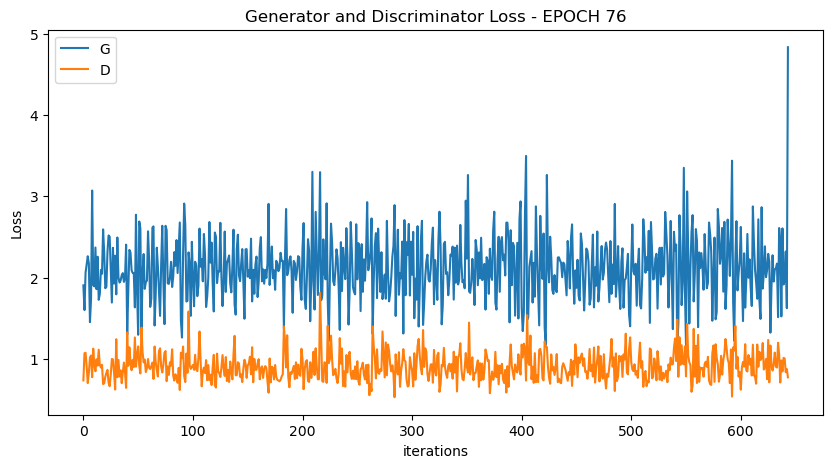

 50%|█████     | 322/644 [10:05<10:34,  1.97s/it]

[78/100][322/644] Loss_D: 0.6742 Loss_G: 2.7033 D(x): 0.8761 D(G(z)): 0.2370 / 0.0614


100%|██████████| 644/644 [20:38<00:00,  1.92s/it]

[78/100][644/644] Loss_D: 1.3057 Loss_G: 2.5800 D(x): 0.5011 D(G(z)): 0.0671 / 0.0582


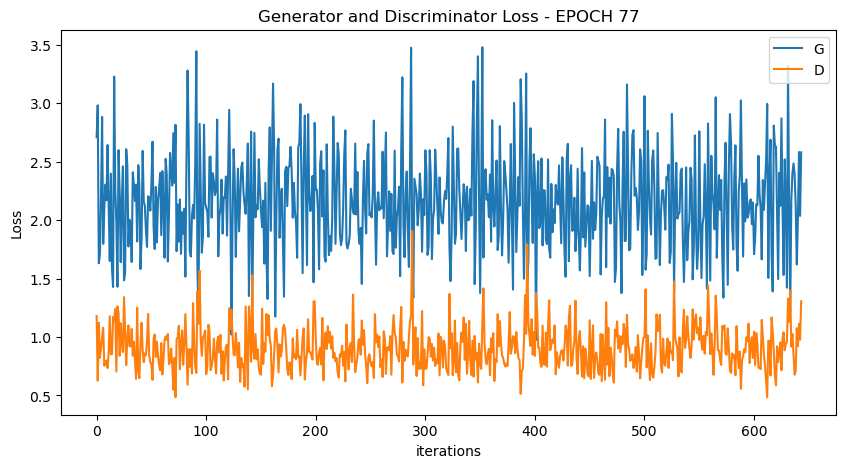

 50%|█████     | 322/644 [11:03<10:51,  2.02s/it]

[79/100][322/644] Loss_D: 1.2660 Loss_G: 1.6765 D(x): 0.5242 D(G(z)): 0.3394 / 0.1934


100%|██████████| 644/644 [22:25<00:00,  2.09s/it]

[79/100][644/644] Loss_D: 0.5418 Loss_G: 5.0729 D(x): 0.8054 D(G(z)): 0.1275 / 0.0037


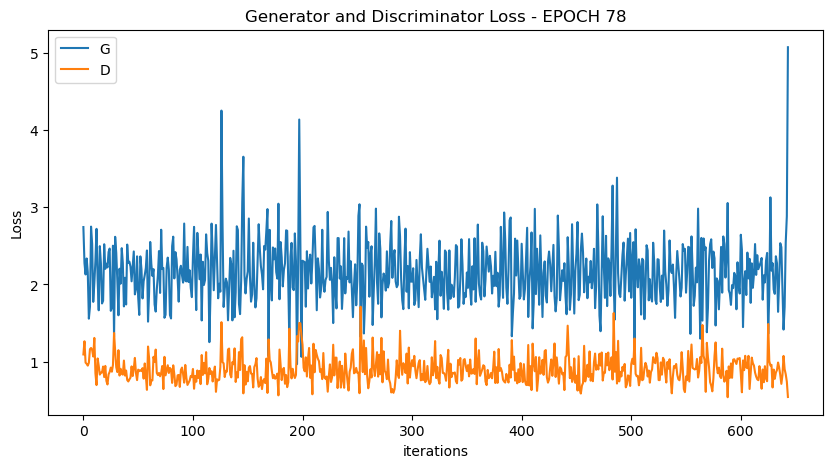

 50%|█████     | 322/644 [10:53<09:40,  1.80s/it]

[80/100][322/644] Loss_D: 1.1109 Loss_G: 2.0650 D(x): 0.7174 D(G(z)): 0.4231 / 0.1356


100%|██████████| 644/644 [21:00<00:00,  1.96s/it]

[80/100][644/644] Loss_D: 1.1731 Loss_G: 5.9436 D(x): 0.5572 D(G(z)): 0.3255 / 0.0168


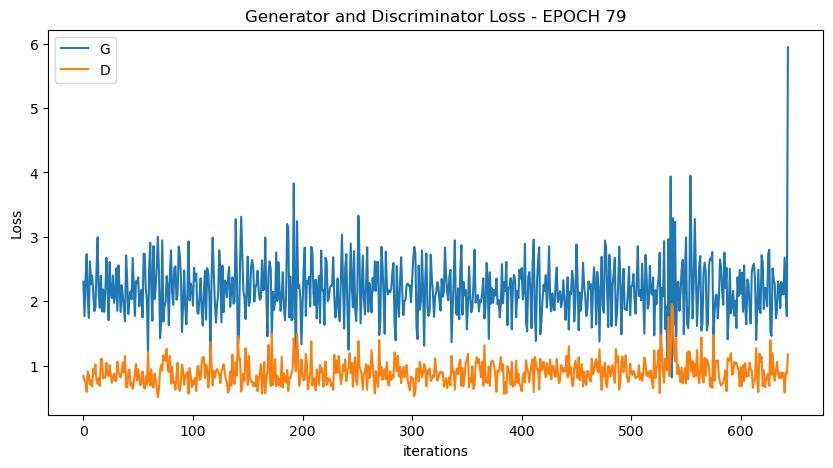

 50%|█████     | 322/644 [10:00<10:05,  1.88s/it]

[81/100][322/644] Loss_D: 0.8490 Loss_G: 2.3153 D(x): 0.6253 D(G(z)): 0.1700 / 0.1102


100%|██████████| 644/644 [20:00<00:00,  1.86s/it]

[81/100][644/644] Loss_D: 0.4963 Loss_G: 5.2560 D(x): 0.9197 D(G(z)): 0.1534 / 0.0043


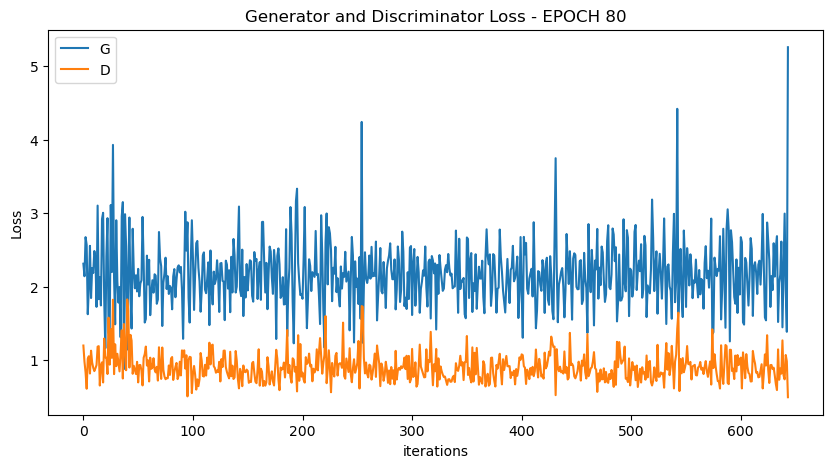

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


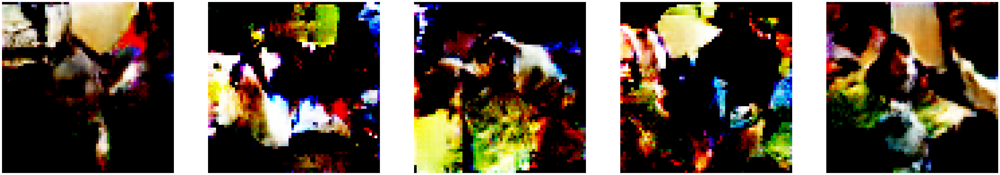

 50%|█████     | 322/644 [10:02<09:42,  1.81s/it]

[82/100][322/644] Loss_D: 0.9800 Loss_G: 1.3999 D(x): 0.5187 D(G(z)): 0.1901 / 0.2783


100%|██████████| 644/644 [19:51<00:00,  1.85s/it]

[82/100][644/644] Loss_D: 1.6069 Loss_G: 3.2731 D(x): 0.2552 D(G(z)): 0.1231 / 0.0633


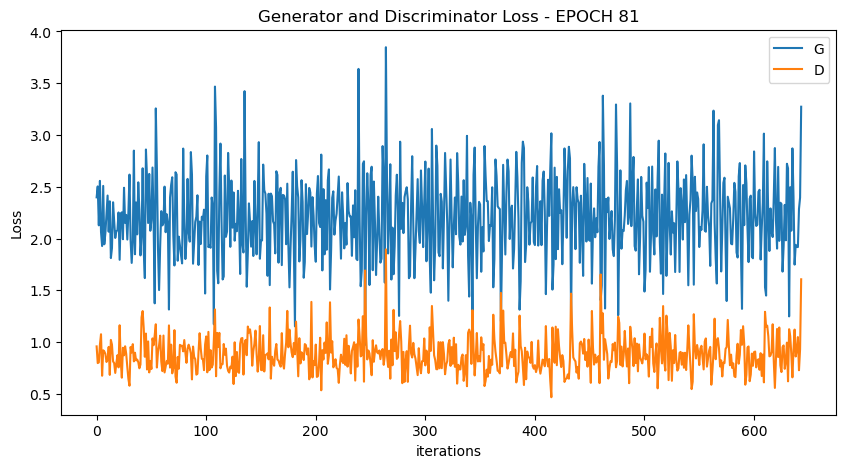

 50%|█████     | 322/644 [09:51<09:45,  1.82s/it]

[83/100][322/644] Loss_D: 1.0097 Loss_G: 1.9317 D(x): 0.5946 D(G(z)): 0.2618 / 0.1777


100%|██████████| 644/644 [19:41<00:00,  1.84s/it]

[83/100][644/644] Loss_D: 2.4966 Loss_G: 1.7679 D(x): 0.1247 D(G(z)): 0.1022 / 0.2064


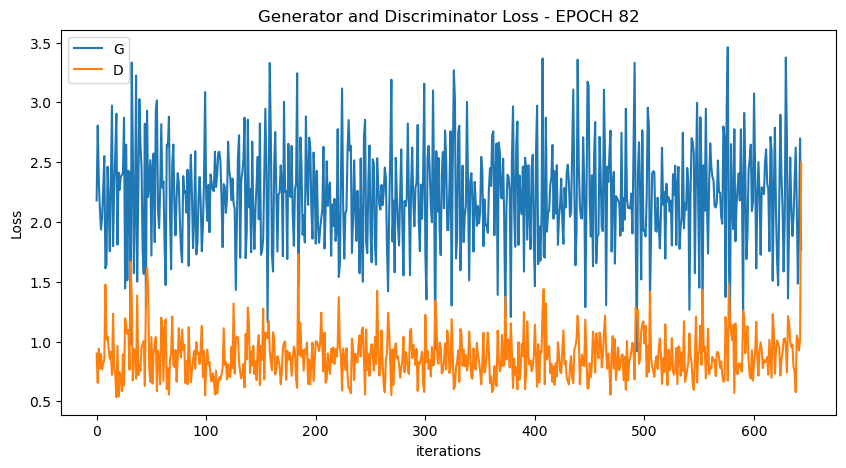

 50%|█████     | 322/644 [09:49<09:52,  1.84s/it]

[84/100][322/644] Loss_D: 0.8770 Loss_G: 2.3799 D(x): 0.5324 D(G(z)): 0.1027 / 0.1147


100%|██████████| 644/644 [19:42<00:00,  1.84s/it]

[84/100][644/644] Loss_D: 0.8716 Loss_G: 3.8212 D(x): 0.5975 D(G(z)): 0.1593 / 0.0157


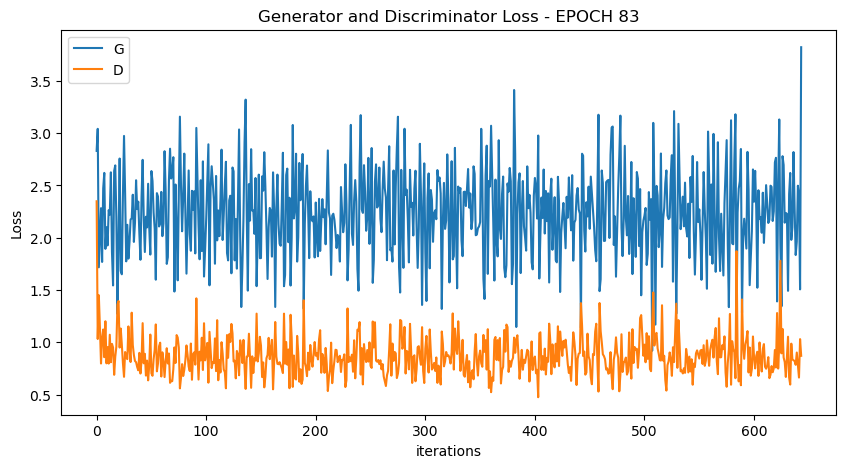

 50%|█████     | 322/644 [09:51<09:56,  1.85s/it]

[85/100][322/644] Loss_D: 0.9168 Loss_G: 1.9531 D(x): 0.5767 D(G(z)): 0.2114 / 0.1412


100%|██████████| 644/644 [19:47<00:00,  1.84s/it]

[85/100][644/644] Loss_D: 1.7906 Loss_G: 2.8264 D(x): 0.3049 D(G(z)): 0.1221 / 0.0759


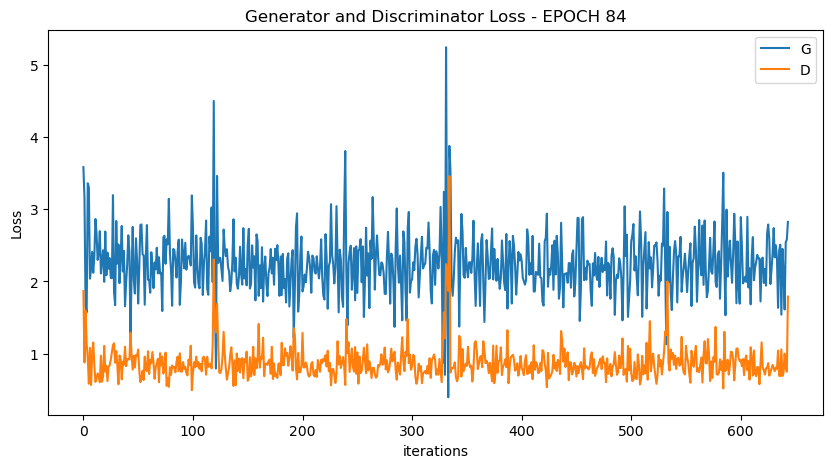

 50%|█████     | 322/644 [09:55<10:02,  1.87s/it]

[86/100][322/644] Loss_D: 0.6096 Loss_G: 2.7469 D(x): 0.8826 D(G(z)): 0.1953 / 0.0662


100%|██████████| 644/644 [19:48<00:00,  1.84s/it]

[86/100][644/644] Loss_D: 0.7472 Loss_G: 4.5727 D(x): 0.6547 D(G(z)): 0.0943 / 0.0136


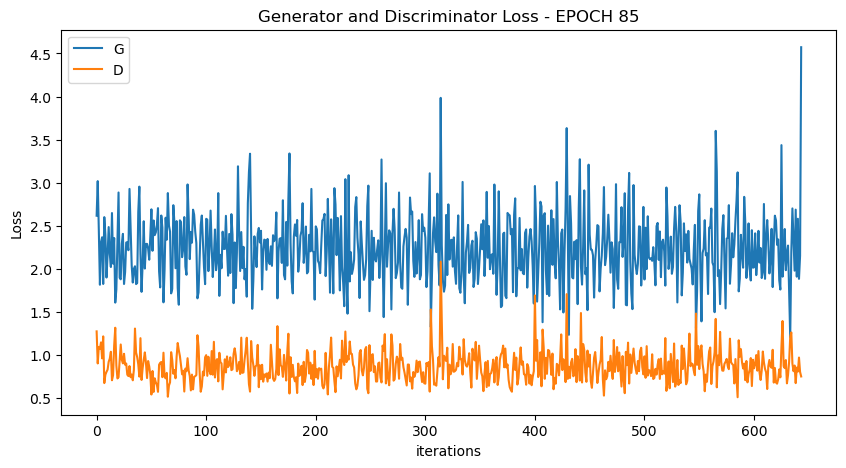

 50%|█████     | 322/644 [09:53<09:25,  1.76s/it]

[87/100][322/644] Loss_D: 0.8699 Loss_G: 2.3597 D(x): 0.7239 D(G(z)): 0.2940 / 0.1136


100%|██████████| 644/644 [19:48<00:00,  1.85s/it]

[87/100][644/644] Loss_D: 1.2425 Loss_G: 3.5826 D(x): 0.3771 D(G(z)): 0.1092 / 0.0203


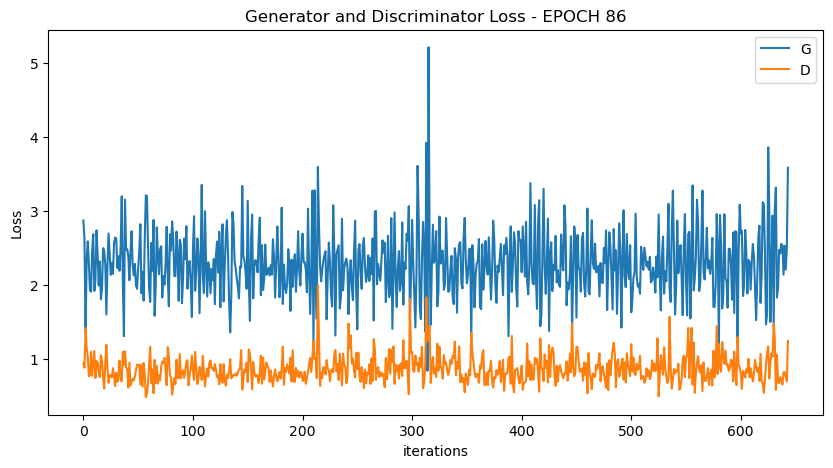

 50%|█████     | 322/644 [09:52<09:57,  1.85s/it]

[88/100][322/644] Loss_D: 0.9658 Loss_G: 1.8702 D(x): 0.5051 D(G(z)): 0.1372 / 0.1671


100%|██████████| 644/644 [19:39<00:00,  1.83s/it]

[88/100][644/644] Loss_D: 0.9628 Loss_G: 9.2587 D(x): 0.7096 D(G(z)): 0.3913 / 0.0001


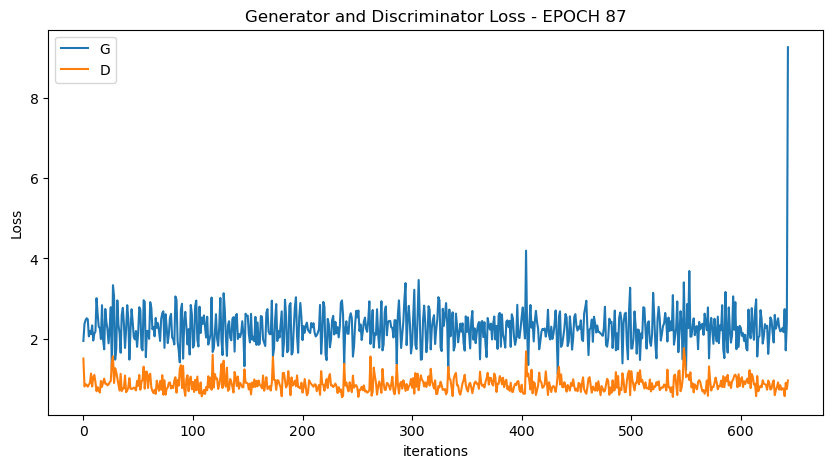

 50%|█████     | 322/644 [09:55<09:48,  1.83s/it]

[89/100][322/644] Loss_D: 0.4976 Loss_G: 3.0262 D(x): 0.7760 D(G(z)): 0.0743 / 0.0525


100%|██████████| 644/644 [19:49<00:00,  1.85s/it]

[89/100][644/644] Loss_D: 1.3517 Loss_G: 1.6346 D(x): 0.3997 D(G(z)): 0.0593 / 0.1847


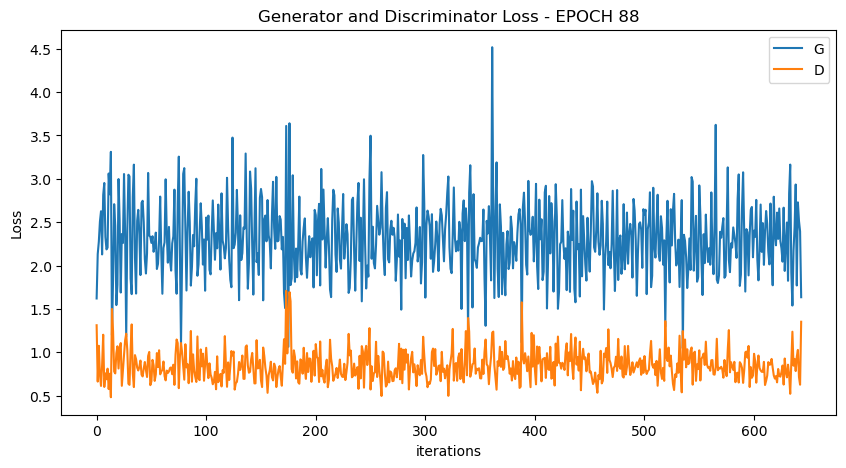

 50%|█████     | 322/644 [09:53<10:21,  1.93s/it]

[90/100][322/644] Loss_D: 0.8441 Loss_G: 2.7256 D(x): 0.7899 D(G(z)): 0.2832 / 0.0752


100%|██████████| 644/644 [19:47<00:00,  1.84s/it]

[90/100][644/644] Loss_D: 0.4880 Loss_G: 5.4939 D(x): 0.7953 D(G(z)): 0.1059 / 0.0027


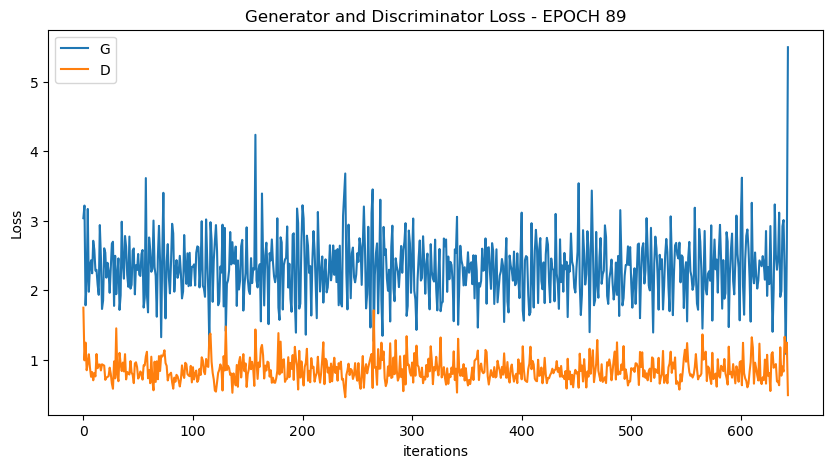

 50%|█████     | 322/644 [09:53<09:56,  1.85s/it]

[91/100][322/644] Loss_D: 0.8369 Loss_G: 1.8623 D(x): 0.6056 D(G(z)): 0.1869 / 0.1558


100%|██████████| 644/644 [19:43<00:00,  1.84s/it]

[91/100][644/644] Loss_D: 2.0068 Loss_G: 1.2664 D(x): 0.2532 D(G(z)): 0.0411 / 0.3083


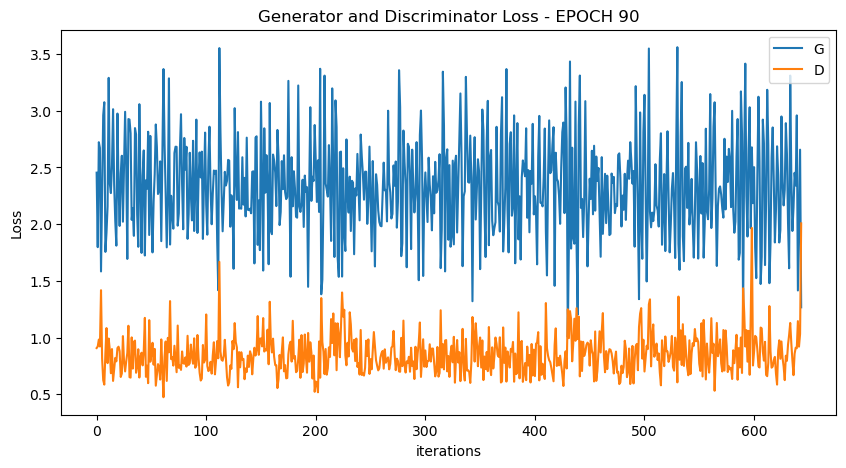

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


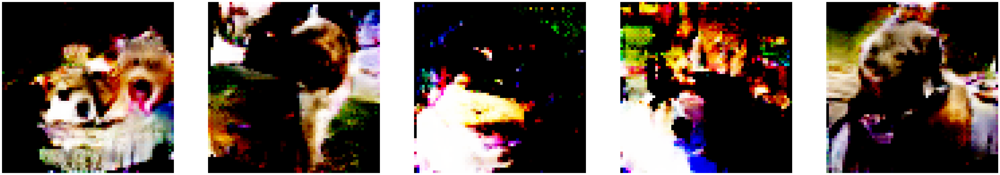

 50%|█████     | 322/644 [09:52<10:14,  1.91s/it]

[92/100][322/644] Loss_D: 0.8927 Loss_G: 2.6009 D(x): 0.7666 D(G(z)): 0.3059 / 0.0695


100%|██████████| 644/644 [19:41<00:00,  1.83s/it]

[92/100][644/644] Loss_D: 1.6042 Loss_G: 3.5768 D(x): 0.3839 D(G(z)): 0.0026 / 0.0193


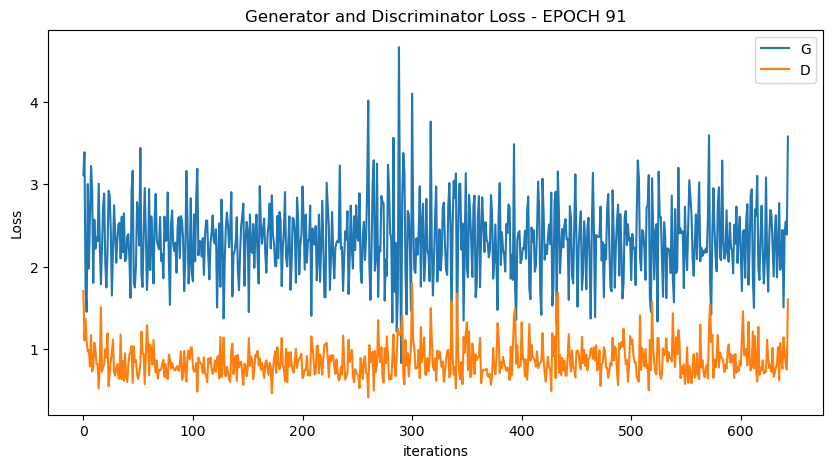

 50%|█████     | 322/644 [09:51<09:53,  1.84s/it]

[93/100][322/644] Loss_D: 0.7343 Loss_G: 2.8627 D(x): 0.7664 D(G(z)): 0.2244 / 0.0541


100%|██████████| 644/644 [19:44<00:00,  1.84s/it]

[93/100][644/644] Loss_D: 1.6430 Loss_G: 3.5347 D(x): 0.2790 D(G(z)): 0.1463 / 0.0402


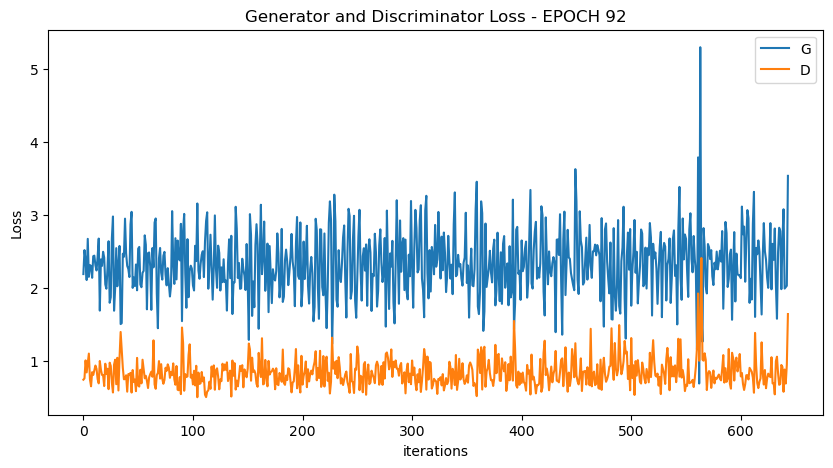

 50%|█████     | 322/644 [09:53<09:58,  1.86s/it]

[94/100][322/644] Loss_D: 0.7937 Loss_G: 2.5541 D(x): 0.5700 D(G(z)): 0.0853 / 0.0931


100%|██████████| 644/644 [19:44<00:00,  1.84s/it]

[94/100][644/644] Loss_D: 0.9848 Loss_G: 5.4324 D(x): 0.6590 D(G(z)): 0.2201 / 0.0091


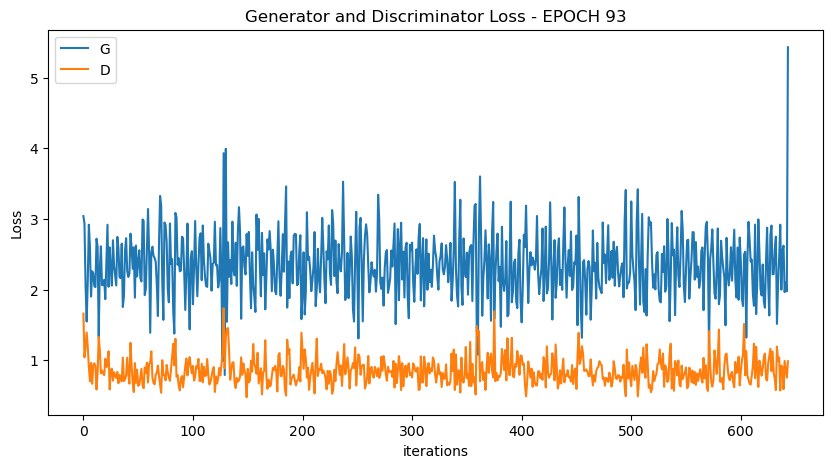

 50%|█████     | 322/644 [09:53<10:09,  1.89s/it]

[95/100][322/644] Loss_D: 0.6595 Loss_G: 2.3608 D(x): 0.6879 D(G(z)): 0.1094 / 0.1022


100%|██████████| 644/644 [19:45<00:00,  1.84s/it]

[95/100][644/644] Loss_D: 0.3583 Loss_G: 4.6985 D(x): 0.8763 D(G(z)): 0.0167 / 0.0059


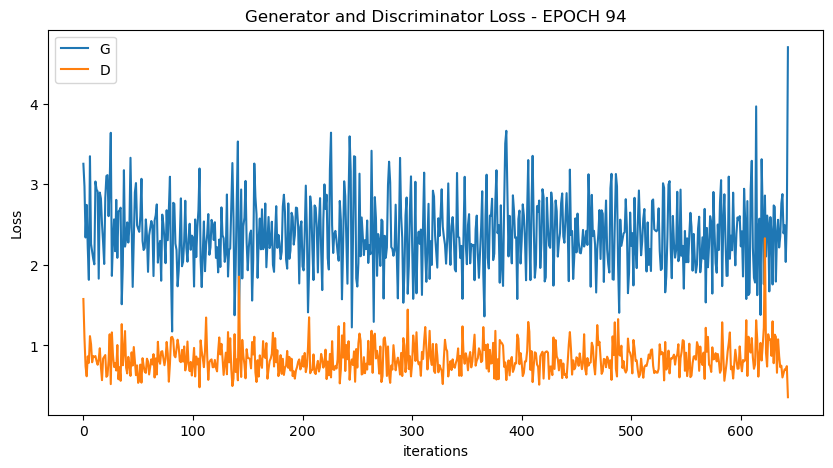

 50%|█████     | 322/644 [09:52<09:46,  1.82s/it]

[96/100][322/644] Loss_D: 0.7023 Loss_G: 2.3425 D(x): 0.6763 D(G(z)): 0.1179 / 0.0951


100%|██████████| 644/644 [19:52<00:00,  1.85s/it]

[96/100][644/644] Loss_D: 0.4258 Loss_G: 4.2472 D(x): 0.9333 D(G(z)): 0.0574 / 0.0091


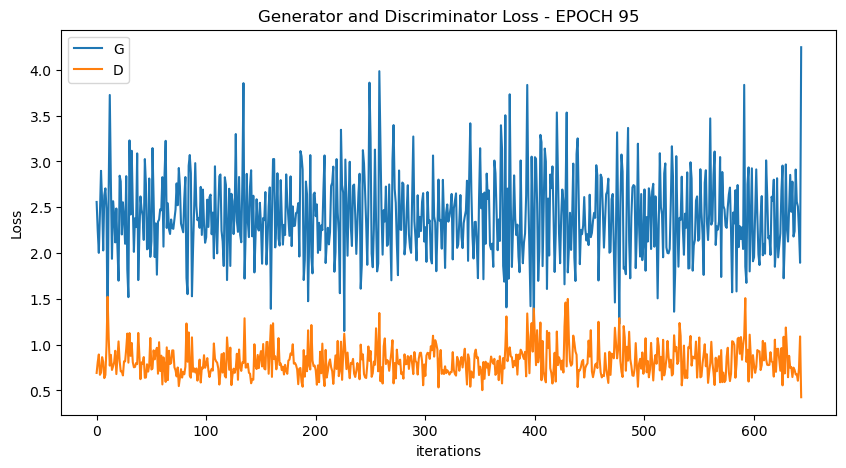

 50%|█████     | 322/644 [10:25<10:22,  1.93s/it]

[97/100][322/644] Loss_D: 0.6391 Loss_G: 2.3420 D(x): 0.7916 D(G(z)): 0.1752 / 0.1028


100%|██████████| 644/644 [20:28<00:00,  1.91s/it]

[97/100][644/644] Loss_D: 1.3235 Loss_G: 2.0092 D(x): 0.3697 D(G(z)): 0.0655 / 0.1265


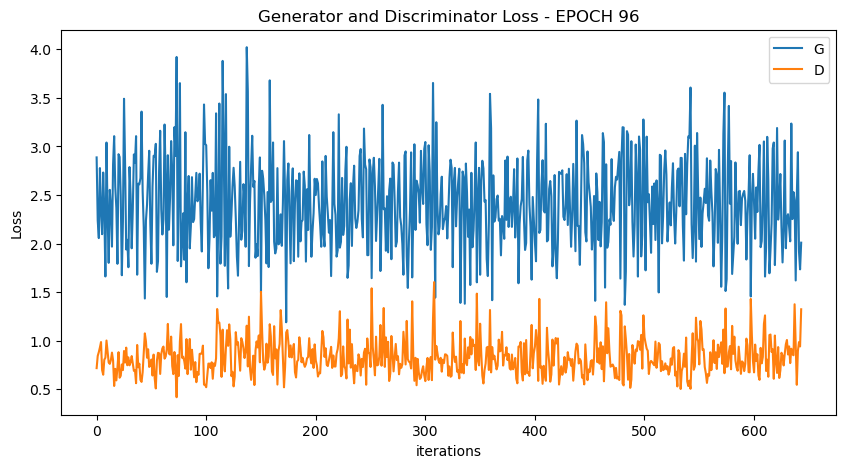

 50%|█████     | 322/644 [09:53<09:57,  1.86s/it]

[98/100][322/644] Loss_D: 0.4656 Loss_G: 3.2790 D(x): 0.8330 D(G(z)): 0.0578 / 0.0468


100%|██████████| 644/644 [20:22<00:00,  1.90s/it]

[98/100][644/644] Loss_D: 0.5459 Loss_G: 5.6927 D(x): 0.9637 D(G(z)): 0.1394 / 0.0064


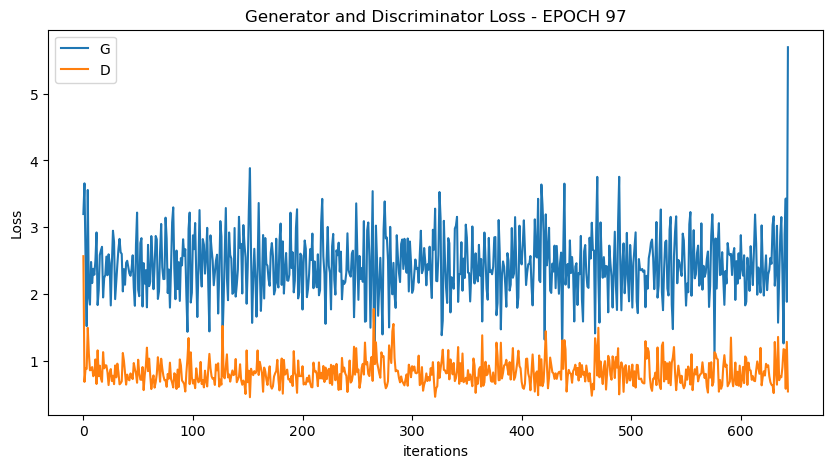

 50%|█████     | 322/644 [13:08<11:49,  2.20s/it]

[99/100][322/644] Loss_D: 0.6779 Loss_G: 2.8646 D(x): 0.9146 D(G(z)): 0.2270 / 0.0601


100%|██████████| 644/644 [25:02<00:00,  2.33s/it]

[99/100][644/644] Loss_D: 1.0879 Loss_G: 2.9980 D(x): 0.3655 D(G(z)): 0.0063 / 0.0507


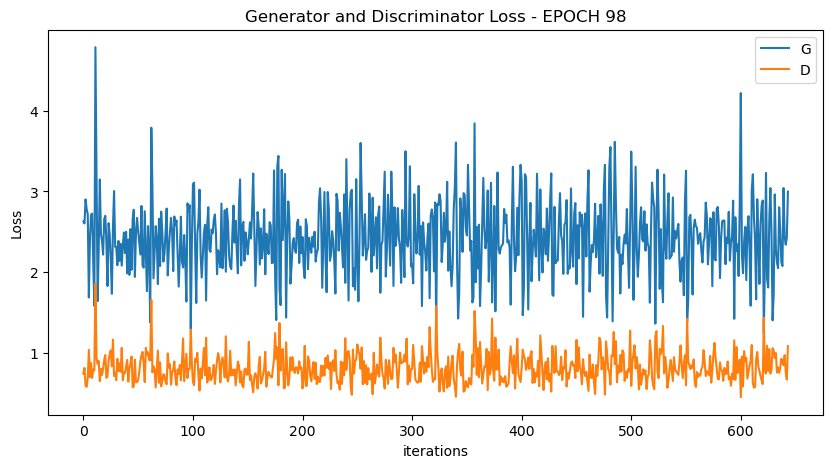

 50%|█████     | 322/644 [10:13<09:56,  1.85s/it]

[100/100][322/644] Loss_D: 0.8067 Loss_G: 2.7256 D(x): 0.7668 D(G(z)): 0.2691 / 0.0804


100%|██████████| 644/644 [20:12<00:00,  1.88s/it]

[100/100][644/644] Loss_D: 0.6883 Loss_G: 4.0923 D(x): 0.7626 D(G(z)): 0.0946 / 0.0241


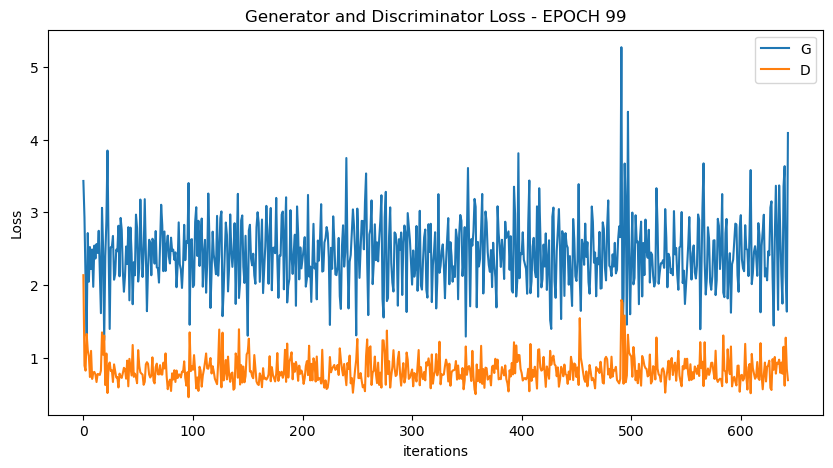

In [16]:
import tqdm

for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm.tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

In [17]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  1155.3706791090965


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


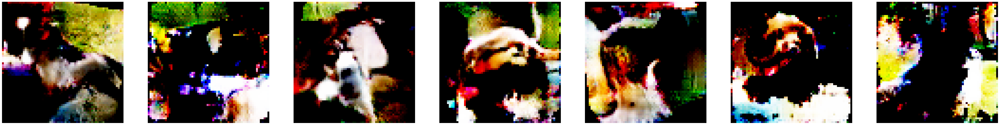

In [18]:
show_generated_img(7)